In [2]:
suppressMessages(library(tidyverse))
suppressMessages(library(parallel))
suppressMessages(library(Seurat))
suppressMessages(library(SeuratData))
suppressMessages(library(patchwork))
suppressMessages(library(Matrix))
suppressMessages(library(viridis))
suppressMessages(library(cowplot))
suppressMessages(library(ggsci))
suppressMessages(library(pheatmap))
suppressMessages(library(RColorBrewer))
suppressMessages(library(reshape2))
suppressMessages(library(LSD))
suppressMessages(library(readxl))
suppressMessages(library(ggrepel))
suppressMessages(library(randomForest))
suppressMessages(library(harmony))
library(Seurat)
library(dplyr)
library(tidyverse)
library(ggplot2)
library(Seurat)
library(sf)
library(RColorBrewer)
library(ggdendro)
suppressMessages(library(SeuratData))
suppressMessages(library(patchwork))
suppressMessages(library(Matrix))
suppressMessages(library(viridis))
suppressMessages(library(cowplot))
suppressMessages(library(ggsci))
suppressMessages(library(pheatmap))
suppressMessages(library(RColorBrewer))
suppressMessages(library(reshape2))
suppressMessages(library(LSD))
suppressMessages(library(readxl))
suppressMessages(library(ggrepel))
suppressMessages(library(harmony))
library(pvclust)

Linking to GEOS 3.11.0, GDAL 3.5.2, PROJ 9.0.1; sf_use_s2() is TRUE



 num [1:64, 1:65] 2768 357 145 105 14 ...
 - attr(*, "dimnames")=List of 2
  ..$ : chr [1:64] "Astrocytes_0" "Astrocytes_1" "Astrocytes_2" "Astrocytes_3" ...
  ..$ : chr [1:65] "Astrocytes_0" "Astrocytes_1" "Astrocytes_2" "Astrocytes_3" ...


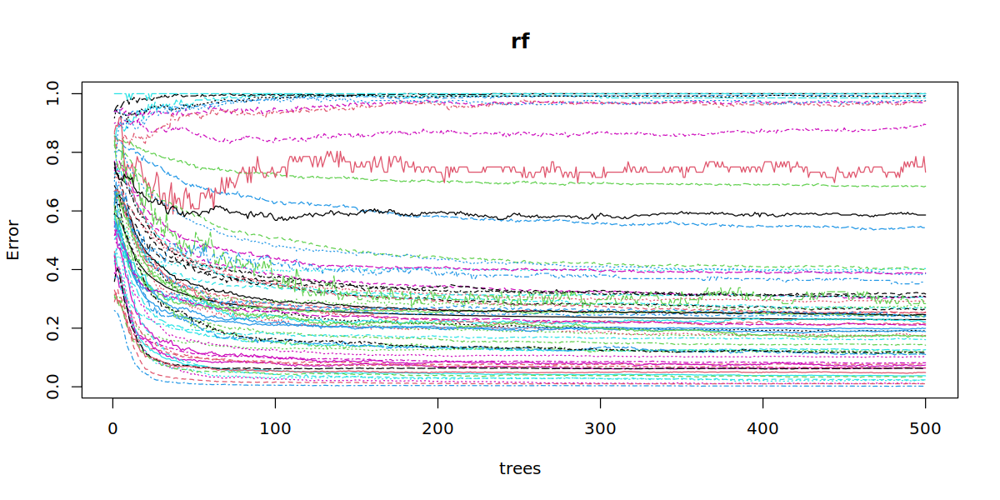

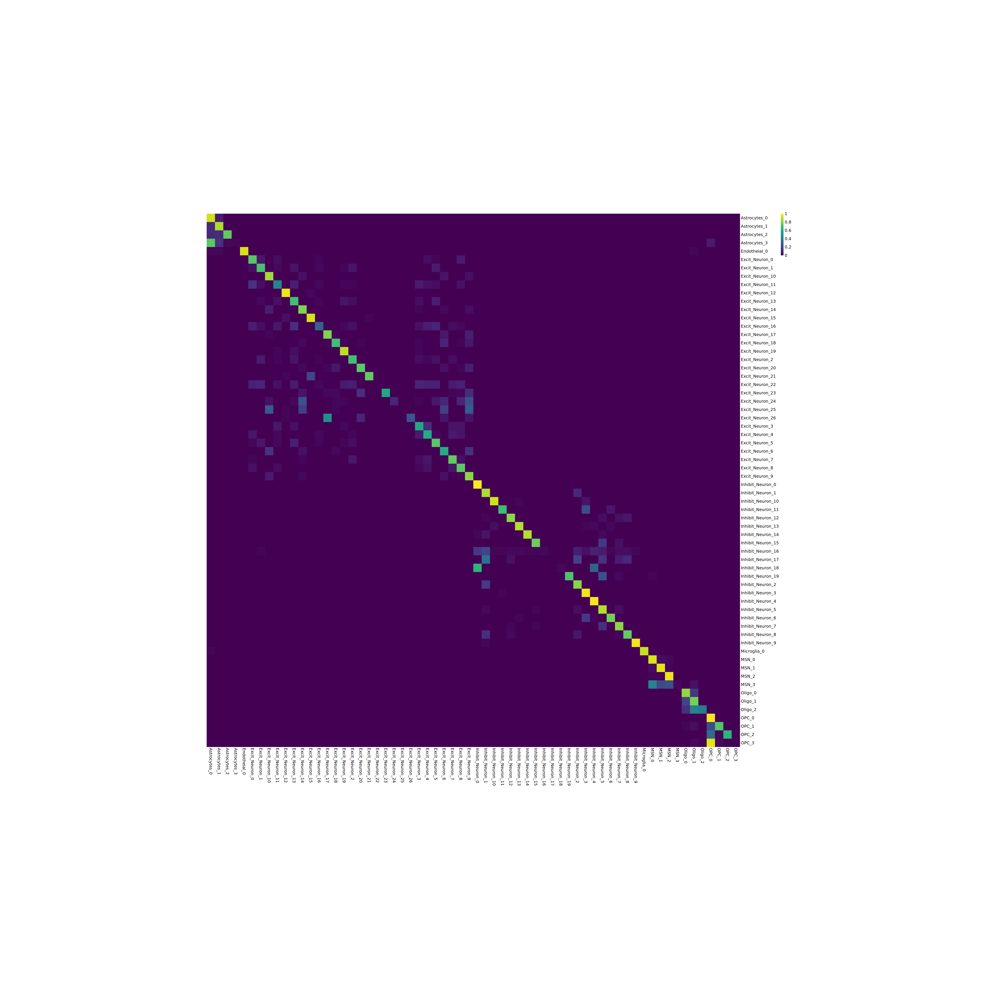

[1] 64

[1] 53

[1] 25

[1] 16

[1] 12

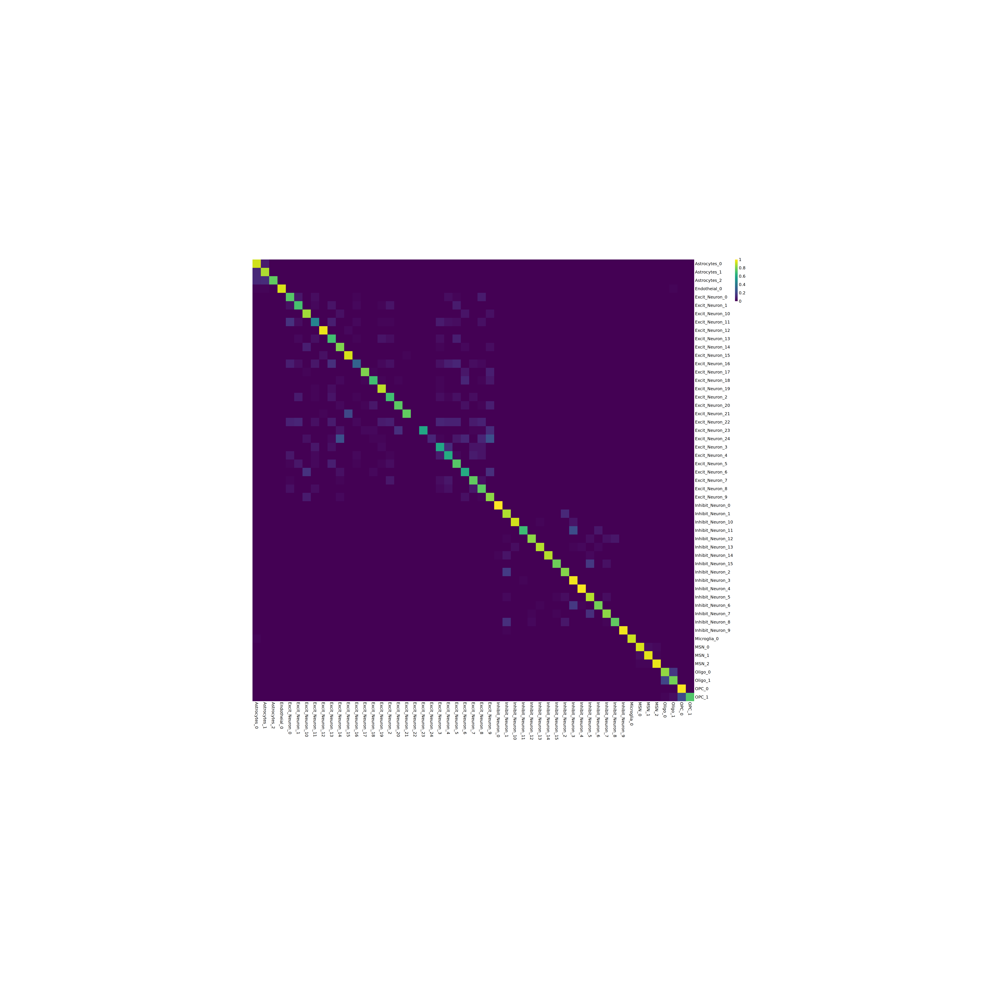

In [3]:

EX_resolution=1.2
IN_resolution=0.8
NON_resolution=0.1


anno_dir='/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/dif_res_anno1/'
anno_file=paste0(anno_dir,EX_resolution,'_res',IN_resolution,'_res',NON_resolution,'_anno.csv')
anno=read.csv(anno_file)
#table(anno$Subclass)


dataDir=anno_dir
saveDir=paste0(dataDir,'train_seurat/')

rf = readRDS(paste0(saveDir, "/Subclass.randomForest.20230627res",EX_resolution,'_res',IN_resolution,".rds"))
str(rf$confusion)
options(repr.plot.width=10, repr.plot.height=5)
plot(rf)

confusionRatio = t(apply(rf$confusion[1:min(dim(rf$confusion)), 1:min(dim(rf$confusion))], 1, function(x) {x/sum(x)}))
options(repr.plot.width=50, repr.plot.height=50)
pheatmap(confusionRatio, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))

df_num=as.data.frame(table(anno$Subclass))
select_cell=df_num[df_num$Freq>600,]$Var1

df_num_ex=df_num[grep('Excit',df_num$Var1),]
fil_n=df_num_ex[df_num_ex$Freq<=500,]$Var1

fil_n=as.character(fil_n)
select_cell=as.character(select_cell)
select_cell=setdiff(select_cell,fil_n)
pheatmap(confusionRatio[intersect(rownames(confusionRatio),select_cell),intersect(colnames(confusionRatio),select_cell)]
, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))

nrow(df_num)
length(select_cell)
ex=select_cell[grep('Ex',select_cell)]
in_=select_cell[grep('In',select_cell)]
non=setdiff(select_cell,c(ex,in_))
length(ex)
length(in_)
length(non)


An object of class Seurat 
43267 features across 237212 samples within 2 assays 
Active assay: SCT (21304 features, 5000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
43267 features across 234126 samples within 2 assays 
Active assay: SCT (21304 features, 5000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

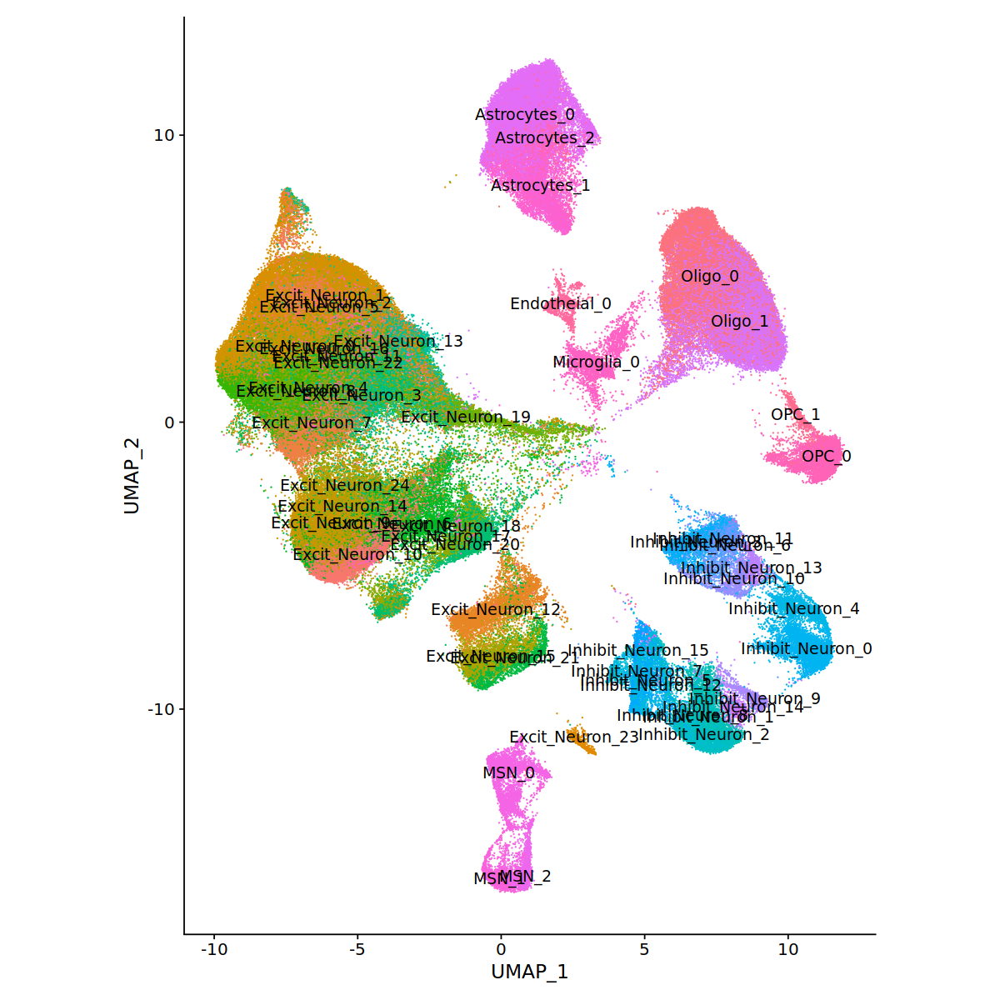

In [3]:
classFiltSeurat=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/macaque_snrna_batch123_soupX_fil300_800_SCT_0106_SCT.rds')
classFiltSeurat
rownames(anno)=anno$X
anno$X=NULL
classFiltSeurat=AddMetaData(classFiltSeurat,anno)

classFiltSeurat1=subset(classFiltSeurat, Subclass %in% select_cell)
Idents(classFiltSeurat1) = "Subclass"
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat1, reduction="umap", label=T,raster=FALSE)+coord_fixed()+NoLegend()
classFiltSeurat1


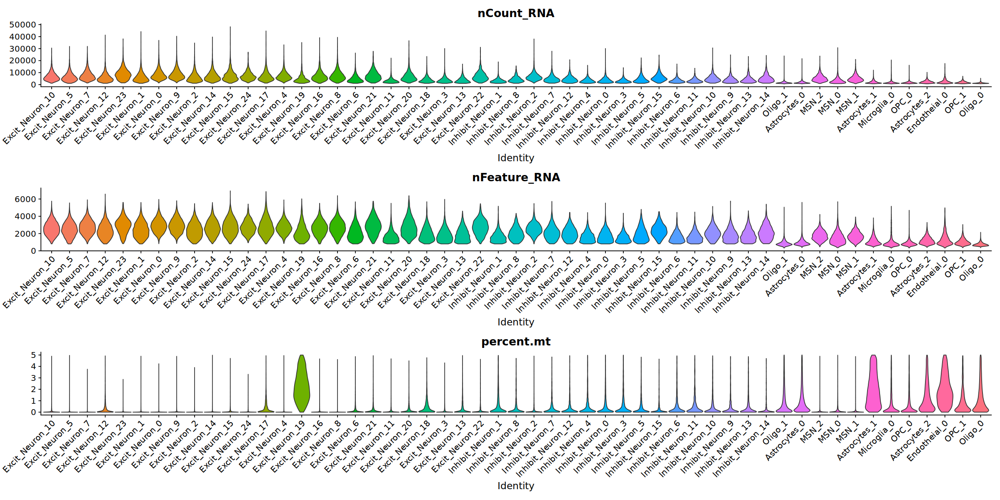

In [4]:
#
options(repr.plot.width=20, repr.plot.height=10)
Idents(classFiltSeurat1) = "Subclass"
VlnPlot(classFiltSeurat1, features=c("nCount_RNA", "nFeature_RNA", "percent.mt"), pt.size=0, ncol=1)


In [80]:
mean(classFiltSeurat3$nCount_RNA)
mean(classFiltSeurat3$nFeature_RNA)

[1] 4664.112

[1] 1883.92

An object of class Seurat 
43267 features across 227750 samples within 2 assays 
Active assay: SCT (21304 features, 5000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

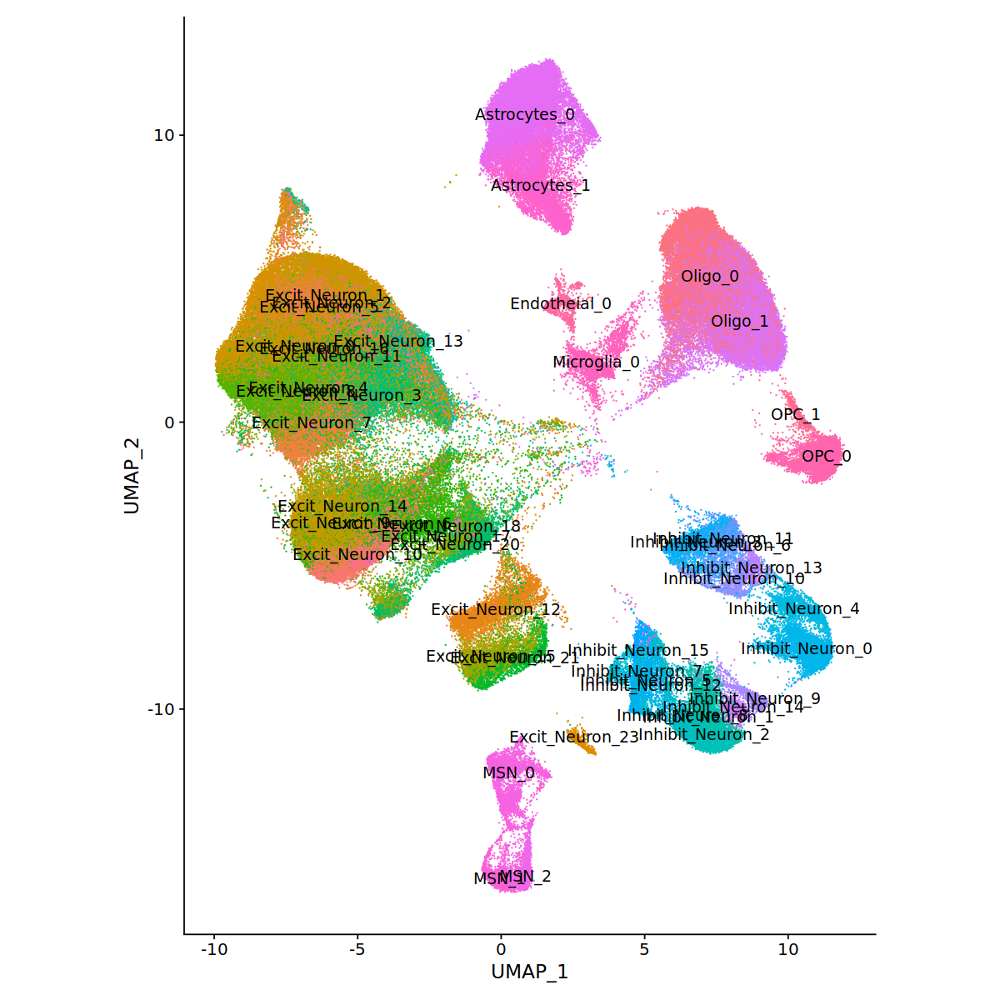

In [5]:

#去掉EX17并保存
select_cell=setdiff(select_cell,c('Astrocytes_2','Excit_Neuron_19','Excit_Neuron_22','Excit_Neuron_24'))
classFiltSeurat1=subset(classFiltSeurat, Subclass %in% select_cell)
Idents(classFiltSeurat1) = "Subclass"
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat1, reduction="umap", label=T,raster=FALSE)+coord_fixed()+NoLegend()
classFiltSeurat1


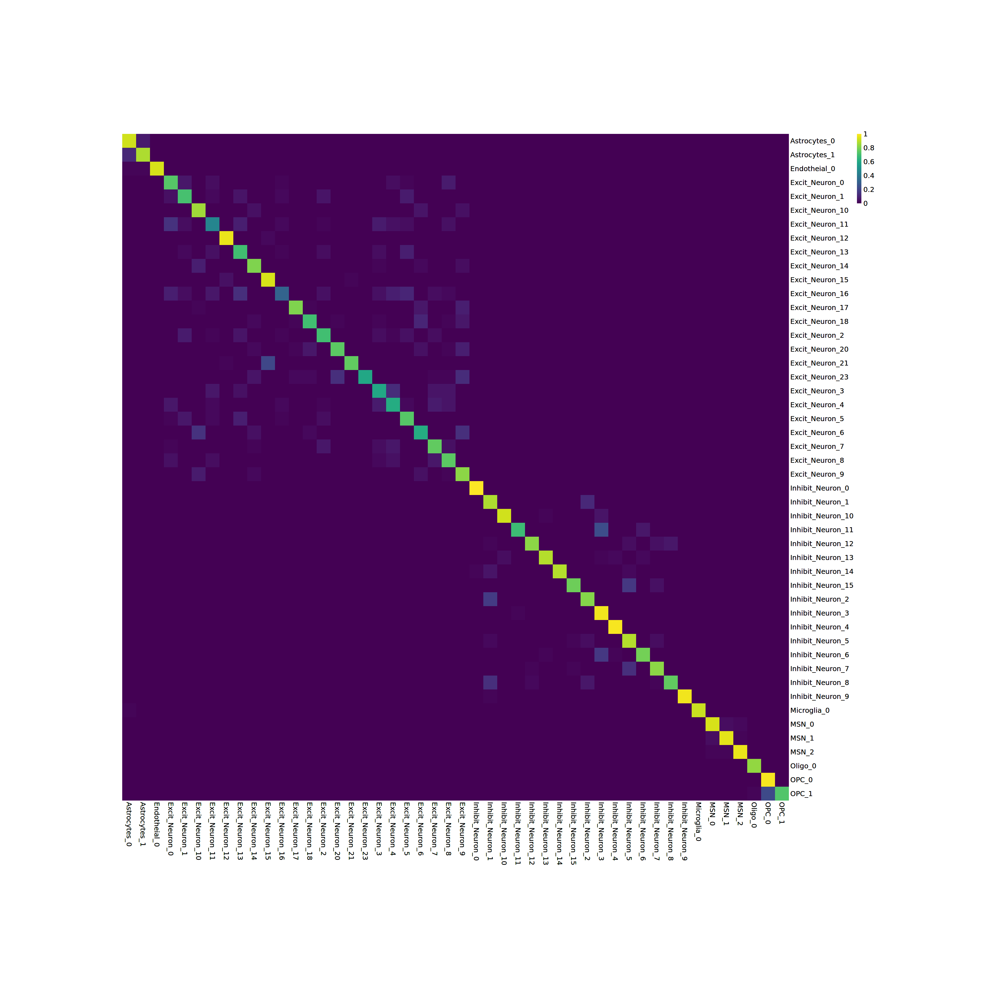

In [4]:
select_cell=setdiff(select_cell,c('Astrocytes_2','Excit_Neuron_19','Excit_Neuron_22','Excit_Neuron_24','Oligo_1'))

options(repr.plot.width=30, repr.plot.height=30)
p1=pheatmap(confusionRatio[intersect(rownames(confusionRatio),select_cell),intersect(colnames(confusionRatio),select_cell)]
, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))
p1


In [5]:
length(intersect(rownames(confusionRatio),select_cell))

[1] 48

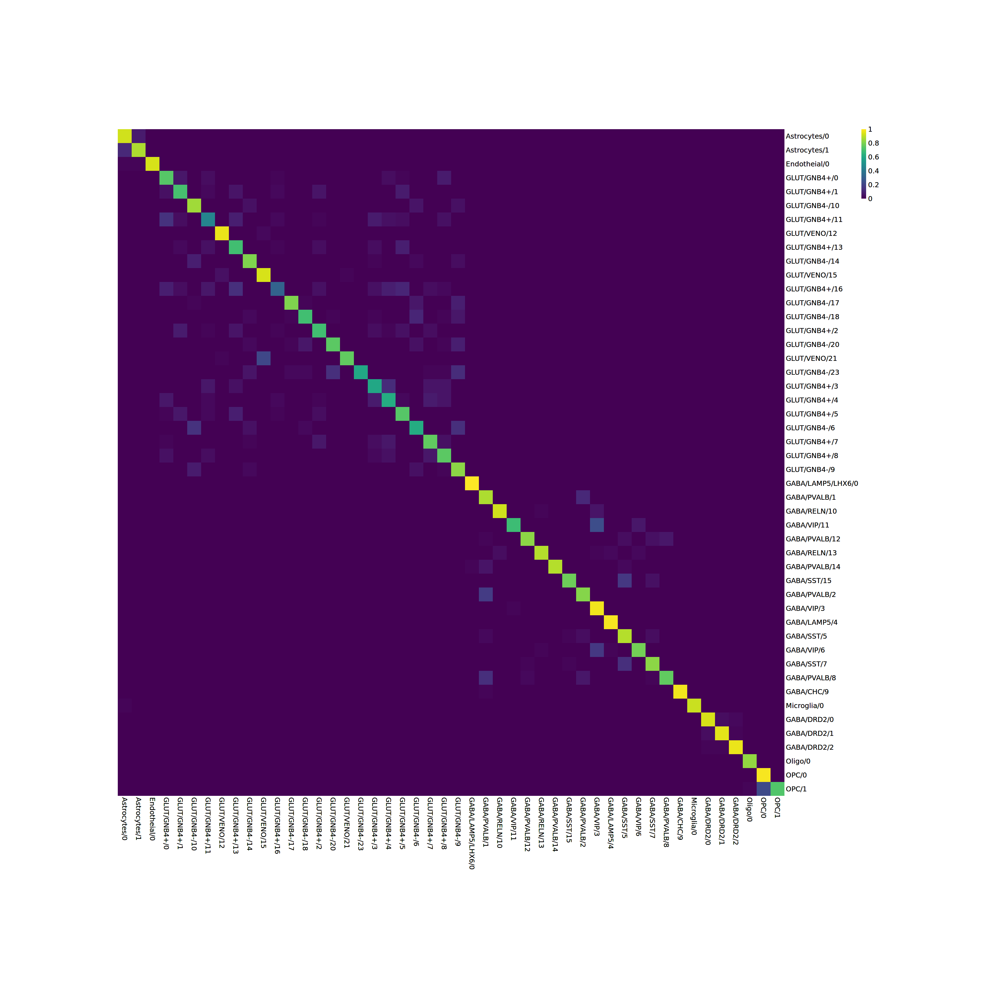

In [9]:
df_ref=classFiltSeurat3@meta.data[,c('Subclass','Cluster')]
df_ref=df_ref[!duplicated(df_ref),]
rownames(df_ref)=df_ref$Subclass

olf_df=confusionRatio[intersect(rownames(confusionRatio),select_cell),intersect(colnames(confusionRatio),select_cell)]
colnames(olf_df)=df_ref[colnames(olf_df),]$Cluster
rownames(olf_df)=df_ref[rownames(olf_df),]$Cluster
colnames(olf_df)=gsub('_','/',colnames(olf_df))
rownames(olf_df)=gsub('_','/',rownames(olf_df))

p1=pheatmap(olf_df
, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))
p1


In [24]:
aba=length(unique(classFiltSeurat3$Cluster))
length(aba[grep('GABA',aba)])
aba[grep('GABA',aba)]
length(aba[grep('GLUT',aba)])
aba[grep('GLUT',aba)]

[1] 19

[1] "GABA_PVALB_1"      "GABA_PVALB_8"      "GABA_PVALB_2"     
 [4] "GABA_SST_7"        "GABA_PVALB_12"     "GABA_LAMP5_4"     
 [7] "GABA_LAMP5_LHX6_0" "GABA_VIP_3"        "GABA_SST_5"       
[10] "GABA_SST_15"       "GABA_VIP_6"        "GABA_VIP_11"      
[13] "GABA_RELN_10"      "GABA_CHC_9"        "GABA_RELN_13"     
[16] "GABA_PVALB_14"     "GABA_DRD2_2"       "GABA_DRD2_0"      
[19] "GABA_DRD2_1"

[1] 22

[1] "GLUT_GNB4-_10" "GLUT_GNB4+_5"  "GLUT_GNB4+_7"  "GLUT_VENO_12" 
 [5] "GLUT_GNB4-_23" "GLUT_GNB4+_1"  "GLUT_GNB4+_0"  "GLUT_GNB4-_9" 
 [9] "GLUT_GNB4+_2"  "GLUT_GNB4-_14" "GLUT_VENO_15"  "GLUT_GNB4-_17"
[13] "GLUT_GNB4+_4"  "GLUT_GNB4+_16" "GLUT_GNB4+_8"  "GLUT_GNB4-_6" 
[17] "GLUT_VENO_21"  "GLUT_GNB4+_11" "GLUT_GNB4-_20" "GLUT_GNB4-_18"
[21] "GLUT_GNB4+_3"  "GLUT_GNB4+_13"

In [25]:
length(unique(classFiltSeurat3$Cluster))

[1] 48

In [26]:
unique(classFiltSeurat3$Cluster)

[1] "GLUT_GNB4-_10"     "GLUT_GNB4+_5"      "GLUT_GNB4+_7"     
 [4] "GLUT_VENO_12"      "GLUT_GNB4-_23"     "GLUT_GNB4+_1"     
 [7] "GLUT_GNB4+_0"      "GLUT_GNB4-_9"      "GLUT_GNB4+_2"     
[10] "GLUT_GNB4-_14"     "GLUT_VENO_15"      "GLUT_GNB4-_17"    
[13] "GLUT_GNB4+_4"      "GLUT_GNB4+_16"     "GLUT_GNB4+_8"     
[16] "GLUT_GNB4-_6"      "GLUT_VENO_21"      "GLUT_GNB4+_11"    
[19] "GLUT_GNB4-_20"     "GLUT_GNB4-_18"     "GLUT_GNB4+_3"     
[22] "GLUT_GNB4+_13"     "GABA_PVALB_1"      "GABA_PVALB_8"     
[25] "GABA_PVALB_2"      "GABA_SST_7"        "GABA_PVALB_12"    
[28] "GABA_LAMP5_4"      "GABA_LAMP5_LHX6_0" "GABA_VIP_3"       
[31] "GABA_SST_5"        "GABA_SST_15"       "GABA_VIP_6"       
[34] "GABA_VIP_11"       "GABA_RELN_10"      "GABA_CHC_9"       
[37] "GABA_RELN_13"      "GABA_PVALB_14"     "Oligo_0"          
[40] "Astrocytes_0"      "GABA_DRD2_2"       "GABA_DRD2_0"      
[43] "GABA_DRD2_1"       "Astrocytes_1"      "Microglia_0"      
[46] "OPC_0"             "Endotheial_0"      "OPC_1"

In [19]:
8164+26129

[1] 34293

In [10]:
save_pheatmap_pdf <- function(x, filename, width=15, height=15) {
  stopifnot(!missing(x))
  stopifnot(!missing(filename))
  pdf(filename, width=width, height=height)
  grid::grid.newpage()
  grid::grid.draw(x$gtable)
  dev.off()
}



save_pheatmap_pdf(p1,"/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/RF.pdf",30,30)


png 
  2

In [7]:
classFiltSeurat=classFiltSeurat1

In [8]:
unique(classFiltSeurat$donor2)

[1] "MQ286" "MQ279" "MQ277" "MQ439"

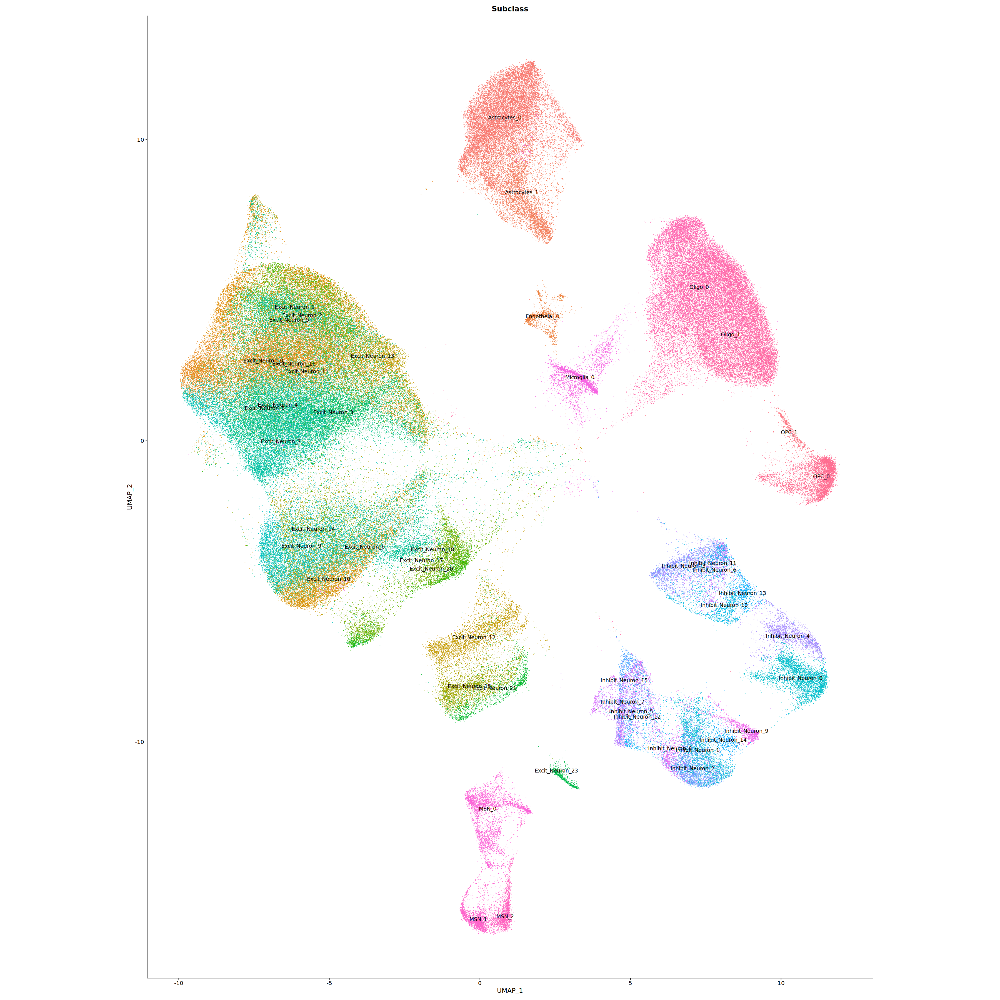

In [9]:
DimPlot(classFiltSeurat,group.by = 'Subclass',label=T,raster=FALSE)+coord_fixed()+NoLegend()


In [10]:
classFiltSeurat

An object of class Seurat 
43267 features across 227750 samples within 2 assays 
Active assay: SCT (21304 features, 5000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

Centering and scaling data matrix

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 11387500)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 11387500)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony converged after 7 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.harmony; see ?make.names for more details on syntax validity”
Computing nearest neighbor graph

Computing SNN

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
17:26:12 UMAP embedding parameters a = 0.9922 b = 1.112

17:26:12 Read 227750 rows and found 30 numeric columns

17:26:12 Using Annoy for neighbor search, n_

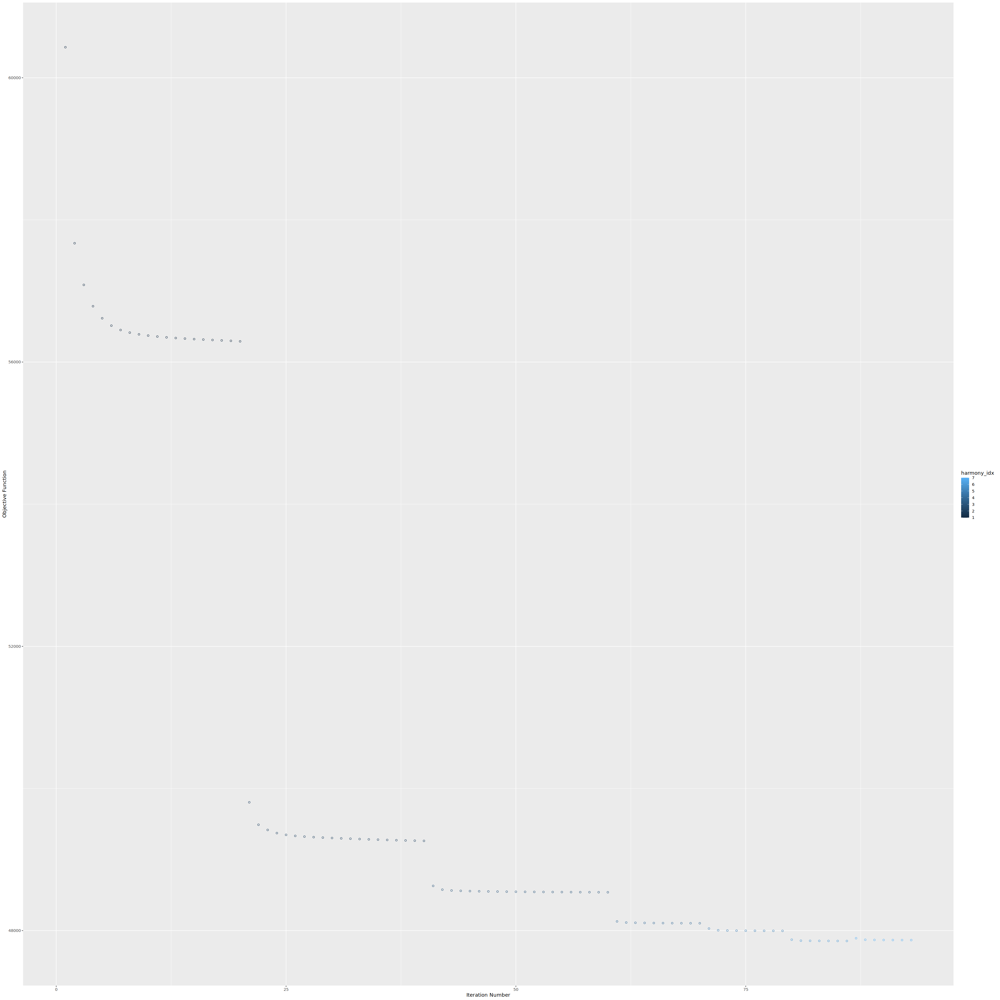

In [11]:
classFiltSeurat =  NormalizeData(classFiltSeurat, normalization.method = "LogNormalize", scale.factor = 10000)
classFiltSeurat = FindVariableFeatures(classFiltSeurat, selection.method = "vst", nfeatures = nrow(classFiltSeurat))
classFiltSeurat = ScaleData(classFiltSeurat, features = rownames(classFiltSeurat))
classFiltSeurat = RunHarmony(
    classFiltSeurat, group.by.vars="donor2", plot_convergence=T, 
    reduction = "pca", dims.use=1:30,
    theta=2,)
classFiltSeurat = classFiltSeurat %>% 
    FindNeighbors(reduction="harmony", dims = 1:30) %>%
    FindClusters(verbose = FALSE) %>%
    RunUMAP(reduction="harmony", dims = 1:30)



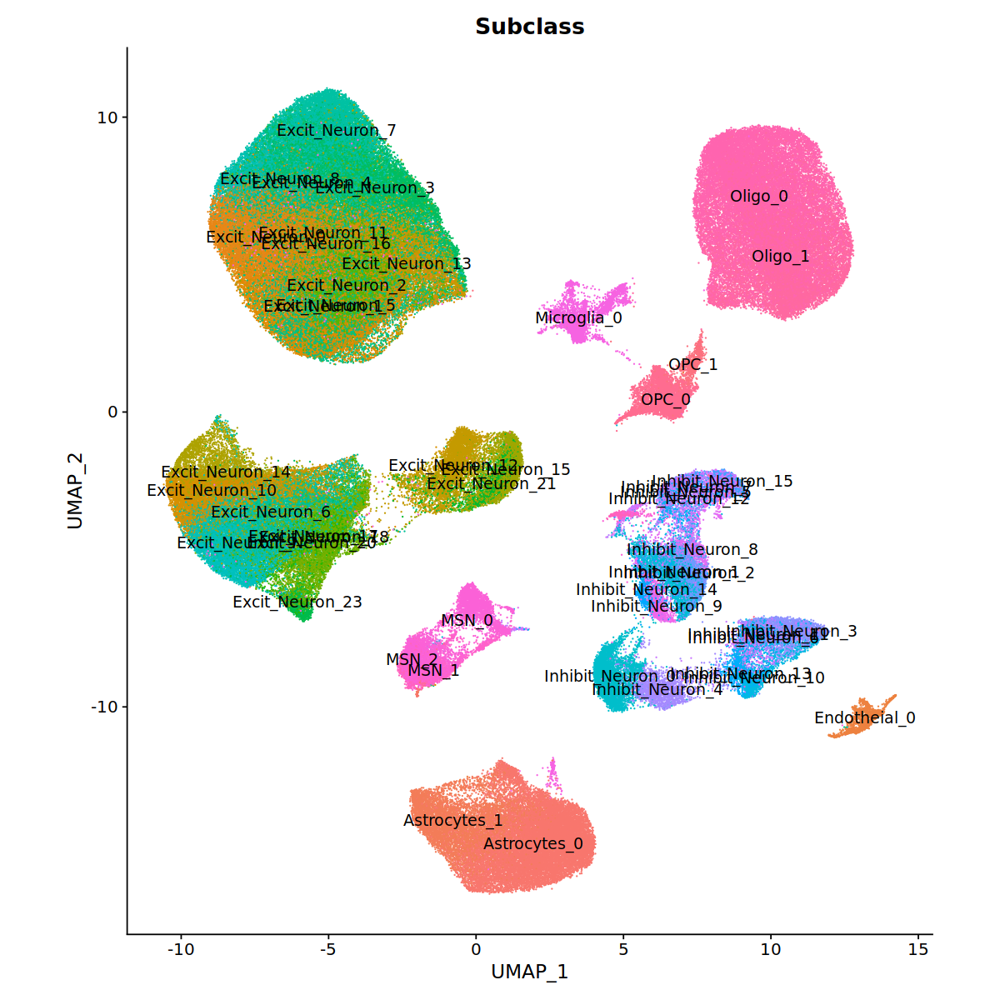

In [12]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat,group.by = 'Subclass',label=T,raster=FALSE)+coord_fixed()+NoLegend()


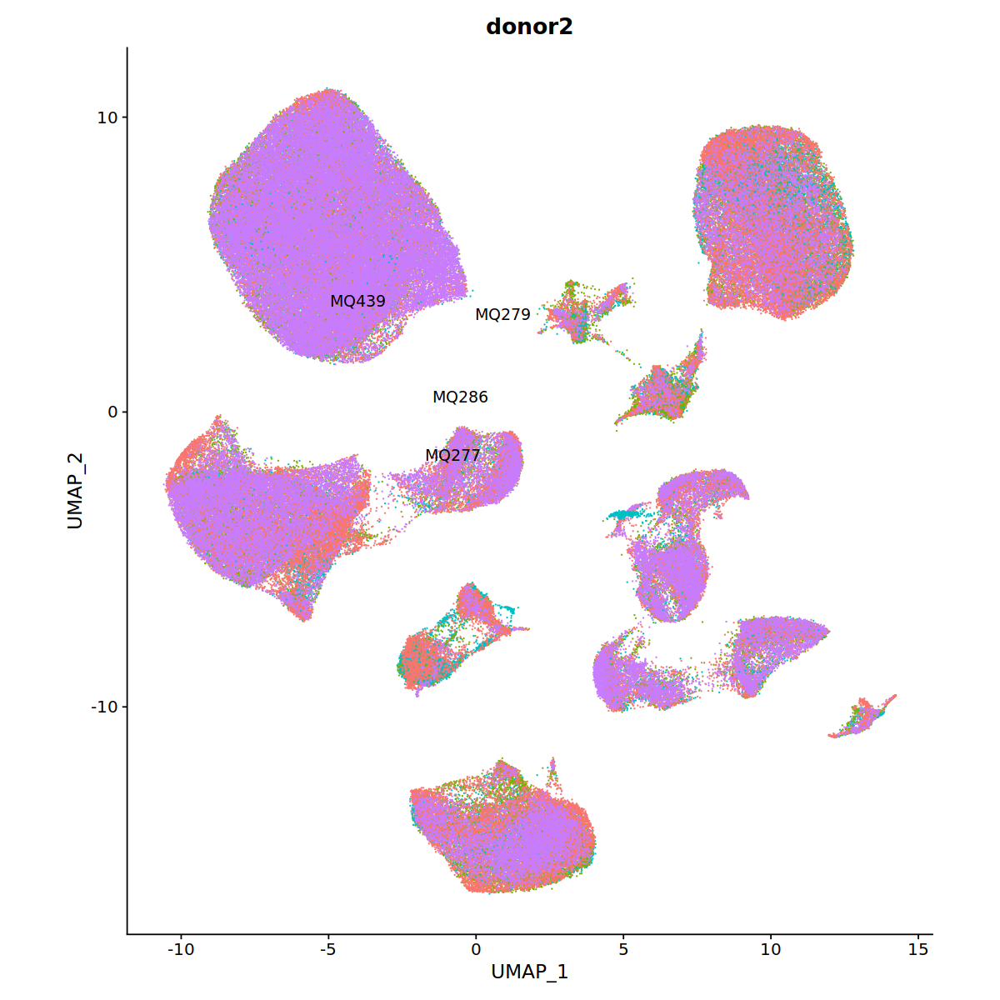

In [13]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat,group.by = 'donor2',label=T,raster=FALSE)+coord_fixed()+NoLegend()


In [14]:
#重命名cluster
get_anno=function(cortex,marker_num){
    cortex$Cluster=cortex$Subclass
    marker=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_1031/dif_res_anno1/train_seurat/train_res1.1_res0.9_res0.15_downsample3000_supercluster_marker.csv')

    sort_marker=marker %>% group_by(cluster) %>% top_n(n=marker_num,wt=avg_log2FC)
    sort_marker1=sort_marker[,c('cluster','gene')]
    sort_marker1=as.data.frame(sort_marker1)
    sort_marker1=sort_marker1[order(sort_marker1$cluster),]
    dotplot_genes=sort_marker$gene
    dotplot_genes=intersect(dotplot_genes,rownames(cortex[["SCT"]]@data))
    sort_marker1=sort_marker1[sort_marker1$gene %in% dotplot_genes,]
    sort_marker1=sort_marker1[!duplicated(sort_marker1$gene),]
    dotplot_genes=sort_marker1$gene

    sel_gene=dotplot_genes
    cla=cortex
    df_ref=cortex@meta.data[,'Cluster',drop=F]
    df_ref$cellID=rownames(df_ref)


    df=cla@assays$SCT@counts[sel_gene,]
    df=as.data.frame(t(df))
    df$cellID=rownames(df)

    df=left_join(df,df_ref)
    df$cellID=NULL

    df_re=split(df,df$Cluster)

    i=1
    df_re[[i]]$Cluster=NULL
    df_sub=as.data.frame(apply(df_re[[i]],2,mean))
    colnames(df_sub)=names(df_re)[i]
    df_sum=df_sub
    for(i in c(2:length(names(df_re)))){df_re[[i]]$Cluster=NULL
    df_sub=as.data.frame(apply(df_re[[i]],2,mean))
    colnames(df_sub)=names(df_re)[i]
    df_sum=cbind(df_sum,df_sub)}

    sel=rownames(df_sum)[apply(df_sum,1,sum)==0]
    other=setdiff(rownames(df_sum),sel)
    df_sum=df_sum[other,]

    #df_sum=df_sum[df_sum$EX_VENO>2,]
    df_sum_renew=apply(df_sum,1,function(f){
        f/max(f)
    })
    reorder_matrix <- function(matrix1, by.rows = TRUE) {
      if (by.rows == TRUE) {
        conf.order <- order(apply(matrix1, 1, which.max))
        matrix1.reordered <- matrix1[conf.order, ]
      } else {
        conf.order <- order(apply(matrix1, 2, which.max))
        matrix1.reordered <- matrix1[, conf.order]
      }
    }

    df_sum_renew1 = reorder_matrix(df_sum_renew, by.rows=F)

    #options(repr.plot.width=80, repr.plot.height=30)
    #pheatmap(df_sum_renew1
    #, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,
    #        color = viridis(100),display_numbers = T )

    rownames(sort_marker1)=sort_marker1$gene
    sort_marker1$rename=paste0(sort_marker1$cluster,'_',sort_marker1$gene)
    df_sum_renew2=df_sum_renew1
    colnames(df_sum_renew2)=sort_marker1[colnames(df_sum_renew1),]$rename
    #sel1=sort_marker1[grep('L[0-9].*',sort_marker1$cluster),]$rename

    sel1=sort_marker1$rename
    as=sel1[grep('Astro',sel1)]
    as1=sel1[grep('Oligo',sel1)]
    sel1=setdiff(sel1,c(as,as1))
    sel2=rownames(df_sum_renew2)[grep('Excit',rownames(df_sum_renew2))]
    df_sum_renew3=df_sum_renew2[,intersect(colnames(df_sum_renew2),sel1)]
    df_sum_renew3=t(df_sum_renew3)



    df_sum_renew3=df_sum_renew3[order(rownames(df_sum_renew3)),]

    df_sum_renew4 = reorder_matrix(df_sum_renew3,by.rows = F)
    options(repr.plot.width=30, repr.plot.height=40)

    name=str_extract(rownames(df_sum_renew4),'.*_')
    name=gsub('_','',name)
    df_sum_renew4=as.data.frame(df_sum_renew4)
    df_sum_renew4$reorder=name
    df_sum_renew4_list=split(df_sum_renew4,df_sum_renew4$reorder)

    aba_all=data.frame()
    df=df_sum_renew4_list[[1]]
    df=as.data.frame(df)
    df$reorder=NULL
    aba=apply(df,2,mean)
    aba_all=rbind(aba_all,aba)
    colnames(aba_all)=names(aba)

    for(i in c(2:length(df_sum_renew4_list))){
        df=df_sum_renew4_list[[i]]
        df=as.data.frame(df)
        df$reorder=NULL
        aba=apply(df,2,mean)
        aba_all=rbind(aba_all,aba)

    }

    rownames(aba_all)=names(df_sum_renew4_list)

    df_sum=data.frame()
    for(i in c(1:ncol(aba_all))){
        cell=colnames(aba_all)[i]
        type=rownames(aba_all)[aba_all[,i]==max(aba_all[,i])]
        df_sum=rbind(df_sum,c(cell,type))
        }
    return(df_sum)
}



In [15]:
df_sum=get_anno(classFiltSeurat,20)

colnames(df_sum)=c('Subclass','renew_type')
df_sum[grep('Astrocytes',df_sum$Subclass),]$renew_type='Astrocytes'
df_sum[grep('OPC',df_sum$Subclass),]$renew_type='OPC'
df_sum[grep('Oligo',df_sum$Subclass),]$renew_type='Oligo'

Joining, by = "cellID"


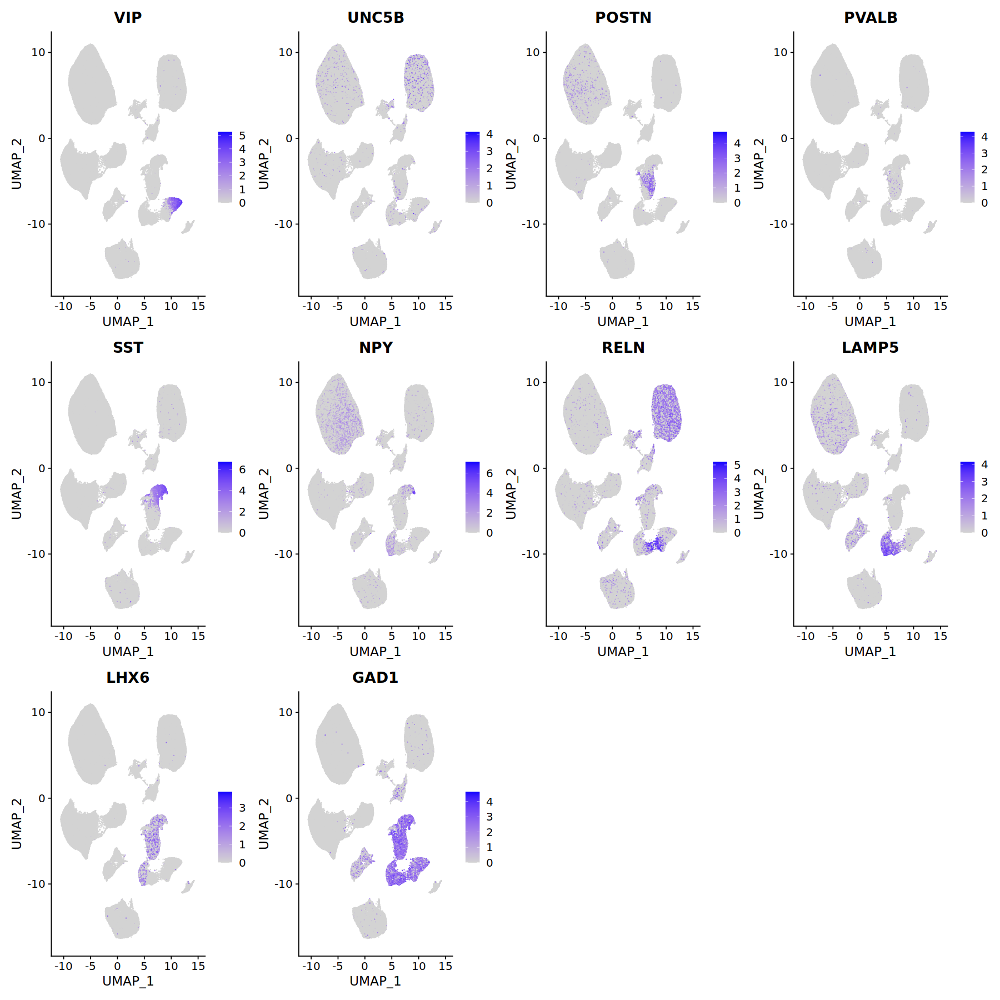

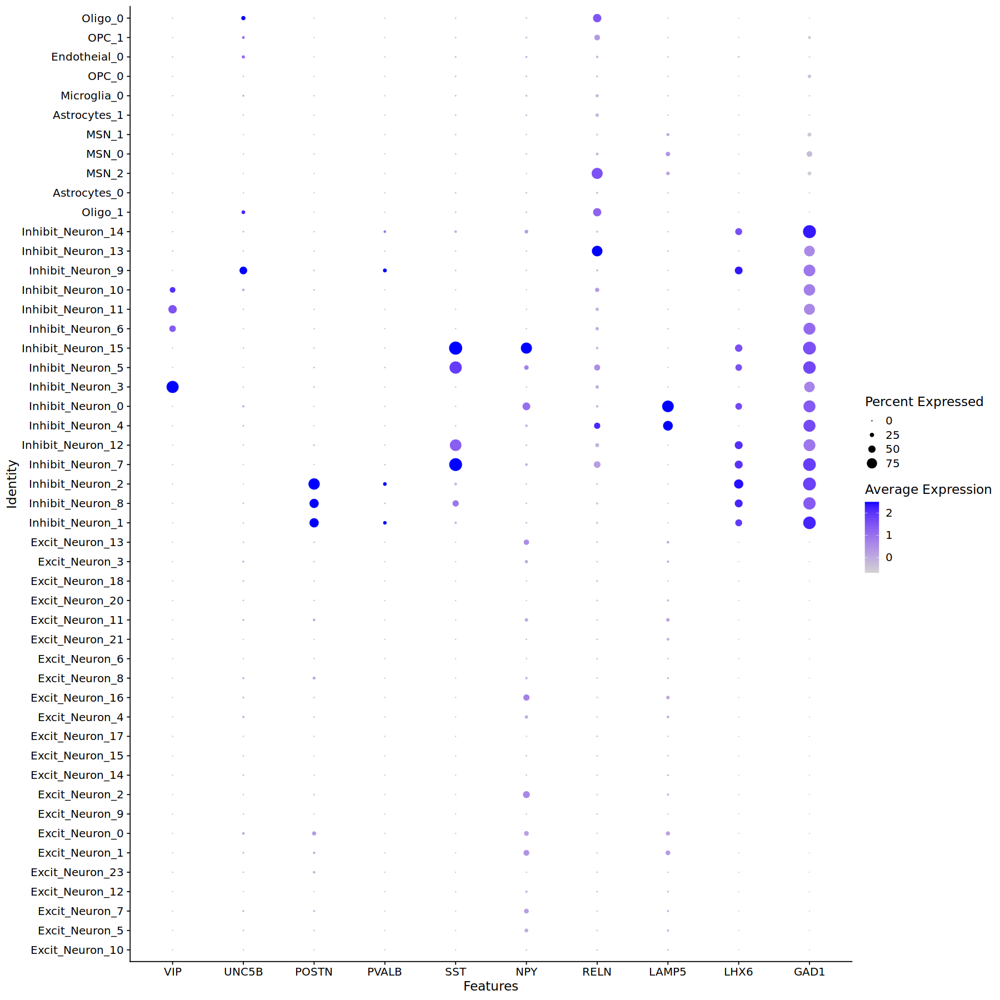

In [16]:

classMarkerTop = c('VIP','UNC5B','POSTN','PVALB','SST','NPY','RELN','LAMP5','LHX6','GAD1')

options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(classFiltSeurat, features = classMarkerTop,raster=FALSE)
Idents(classFiltSeurat)='Subclass'
DotPlot(classFiltSeurat, features = classMarkerTop)

In [17]:
df_sum[df_sum$Subclass %in% c('Inhibit_Neuron_0'),]$renew_type='INLAMP5_LHX6'


Joining, by = "Subclass"


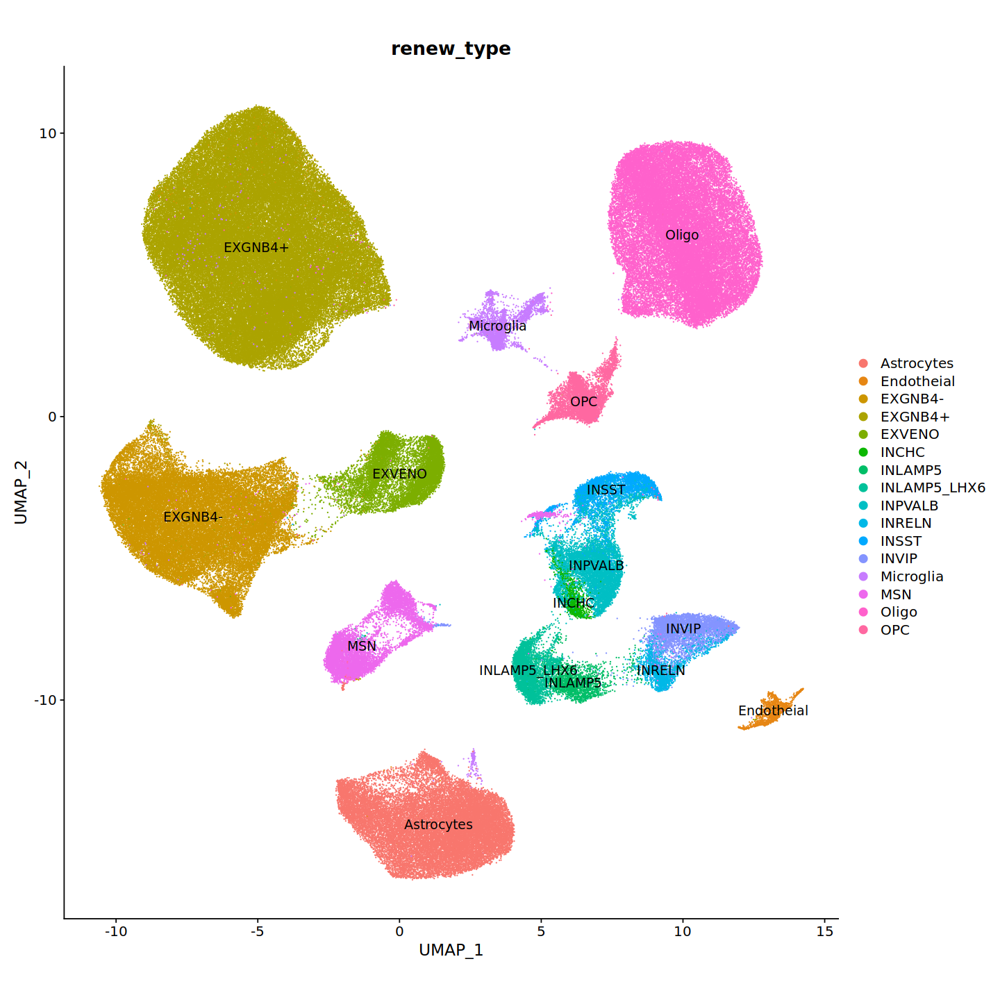

In [18]:
cortex=classFiltSeurat
ref=cortex@meta.data[,'Subclass',drop=F]
ref$ID=rownames(ref)
colnames(df_sum)=c('Subclass','renew_type')
ref=left_join(ref,df_sum)
cortex=AddMetaData(cortex,ref$renew_type,col.name = 'renew_type')


options(repr.plot.width=12, repr.plot.height=12)
DimPlot(cortex,group.by = 'renew_type',label=T,raster=FALSE)+coord_fixed()


In [19]:
classFiltSeurat2=cortex
unique(classFiltSeurat2$renew_type)
classFiltSeurat2$SuperCluster=classFiltSeurat2$renew_type
classFiltSeurat2$SuperCluster=gsub('EX','GLUT_',classFiltSeurat2$SuperCluster)
classFiltSeurat2$SuperCluster=gsub('IN','GABA_',classFiltSeurat2$SuperCluster)
classFiltSeurat2$SuperCluster=gsub('MSN','GABA_DRD2',classFiltSeurat2$SuperCluster)
unique(classFiltSeurat2$SuperCluster)

col=unique(classFiltSeurat2$SuperCluster)
names(col)=c(brewer.pal(9,"Set1"),brewer.pal(7,"Set2"))[1:length(col)]
df_col=as.data.frame(col)
colnames(df_col)='SuperCluster'
df_col$color=names(col)
pale=df_col$color
names(pale)=df_col$SuperCluster


[1] "EXGNB4-"      "EXGNB4+"      "EXVENO"       "INPVALB"      "INSST"       
 [6] "INLAMP5"      "INLAMP5_LHX6" "INVIP"        "INRELN"       "INCHC"       
[11] "Oligo"        "Astrocytes"   "MSN"          "Microglia"    "OPC"         
[16] "Endotheial"

[1] "GLUT_GNB4-"      "GLUT_GNB4+"      "GLUT_VENO"       "GABA_PVALB"     
 [5] "GABA_SST"        "GABA_LAMP5"      "GABA_LAMP5_LHX6" "GABA_VIP"       
 [9] "GABA_RELN"       "GABA_CHC"        "Oligo"           "Astrocytes"     
[13] "GABA_DRD2"       "Microglia"       "OPC"             "Endotheial"

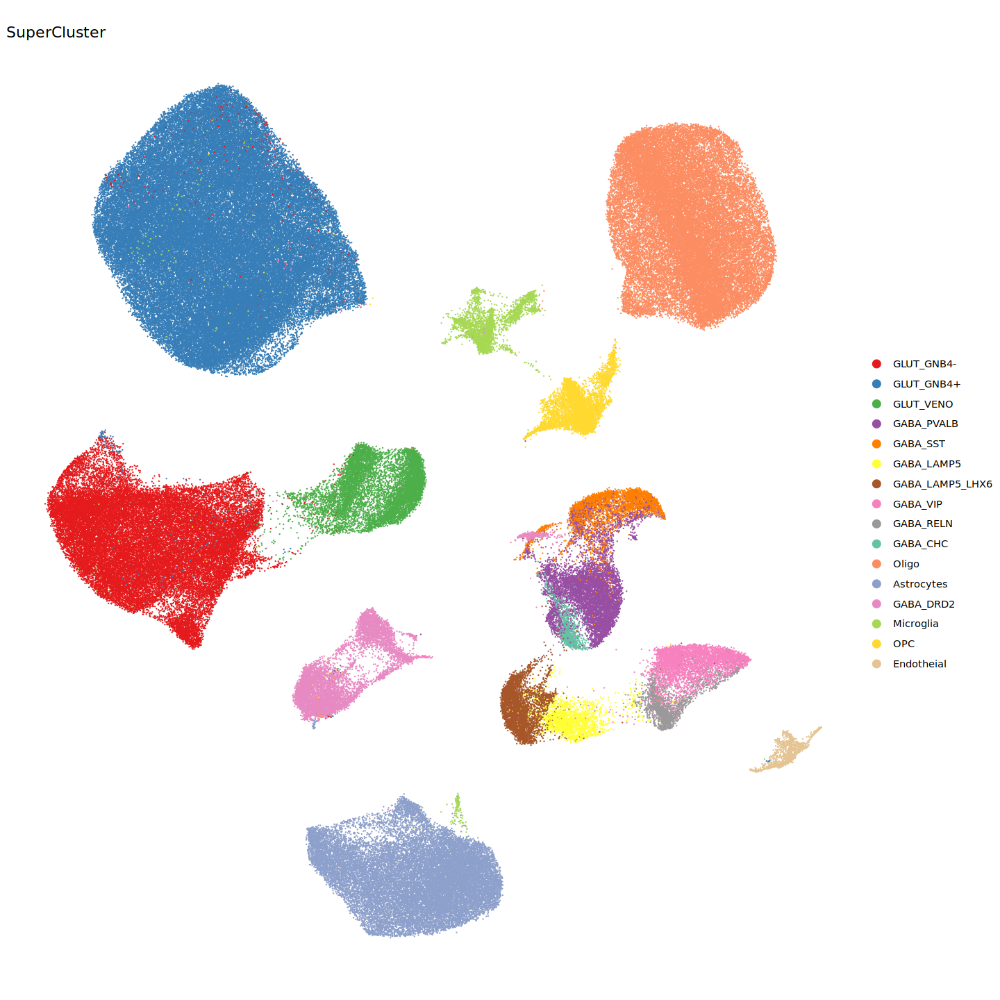

In [69]:
Idents(classFiltSeurat3)='SuperCluster'
options(repr.plot.width=12, repr.plot.height=12)
gp=DimPlot(classFiltSeurat3,group.by = 'SuperCluster',pt.size=0.01,label=F,raster=FALSE,cols = pale)+coord_fixed()+NoLegend()+theme_void()
gp

In [27]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/umap1.pdf", width=12, height=12)
gp
dev.off()


png 
  2

In [72]:
length(unique(classFiltSeurat3$Cluster))

[1] 48

png 
  2

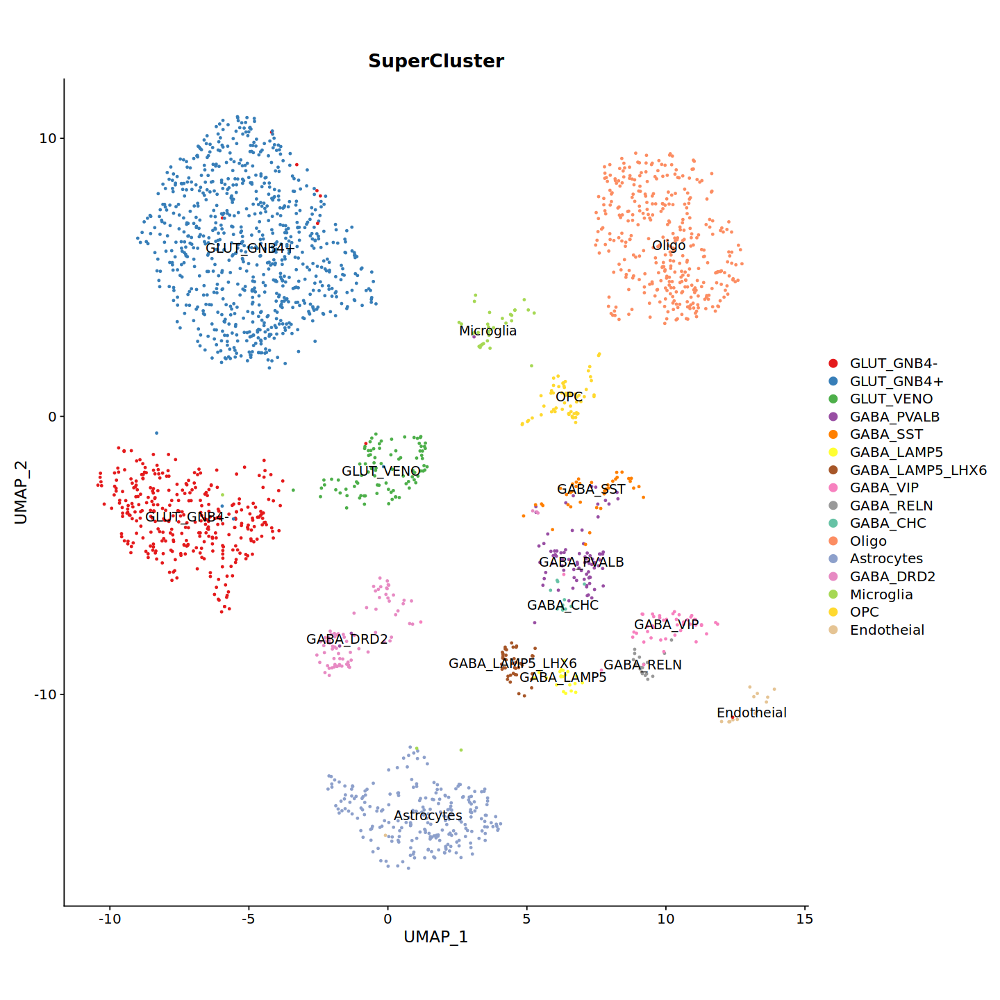

In [24]:
#按照比例downsample
ratio=0.01

df=split(classFiltSeurat3@meta.data,classFiltSeurat3@meta.data$Subclass)
all_n=c()
for(i in c(1:length(df))){
    down_num=round(nrow(df[[i]])*ratio)
    sel_n=sample(rownames(df[[i]]),down_num)
    all_n=c(all_n,sel_n)
}

classFiltSeurat3_down=subset(classFiltSeurat3,cells = all_n)


options(repr.plot.width=12, repr.plot.height=12)
gp=DimPlot(classFiltSeurat3_down,group.by = 'SuperCluster',label=T,raster=FALSE,cols = pale)+coord_fixed()
gp
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/umap.pdf", width=12, height=12)
gp
dev.off()

In [21]:
#
classFiltSeurat3=classFiltSeurat2
classFiltSeurat3$id=str_extract(classFiltSeurat3$Subclass,'_[0-9]*$')
classFiltSeurat3$Cluster=paste0(classFiltSeurat3$SuperCluster,classFiltSeurat3$id)
length(unique(classFiltSeurat3$Cluster))
unique(classFiltSeurat3$Cluster)

[1] 49

[1] "GLUT_GNB4-_10"     "GLUT_GNB4+_5"      "GLUT_GNB4+_7"     
 [4] "GLUT_VENO_12"      "GLUT_GNB4-_23"     "GLUT_GNB4+_1"     
 [7] "GLUT_GNB4+_0"      "GLUT_GNB4-_9"      "GLUT_GNB4+_2"     
[10] "GLUT_GNB4-_14"     "GLUT_VENO_15"      "GLUT_GNB4-_17"    
[13] "GLUT_GNB4+_4"      "GLUT_GNB4+_16"     "GLUT_GNB4+_8"     
[16] "GLUT_GNB4-_6"      "GLUT_VENO_21"      "GLUT_GNB4+_11"    
[19] "GLUT_GNB4-_20"     "GLUT_GNB4-_18"     "GLUT_GNB4+_3"     
[22] "GLUT_GNB4+_13"     "GABA_PVALB_1"      "GABA_PVALB_8"     
[25] "GABA_PVALB_2"      "GABA_SST_7"        "GABA_PVALB_12"    
[28] "GABA_LAMP5_4"      "GABA_LAMP5_LHX6_0" "GABA_VIP_3"       
[31] "GABA_SST_5"        "GABA_SST_15"       "GABA_VIP_6"       
[34] "GABA_VIP_11"       "GABA_RELN_10"      "GABA_CHC_9"       
[37] "GABA_RELN_13"      "GABA_PVALB_14"     "Oligo_1"          
[40] "Astrocytes_0"      "GABA_DRD2_2"       "GABA_DRD2_0"      
[43] "GABA_DRD2_1"       "Astrocytes_1"      "Microglia_0"      
[46] "OPC_0"             "Endotheial_0"      "OPC_1"            
[49] "Oligo_0"

In [29]:

write.csv(classFiltSeurat3@meta.data,'/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/dif_res_anno1/final_anno/48cl_240118_merge_oligo_Cluster_Supercluster_res12_meta.csv')


In [28]:
classFiltSeurat3$Cluster

,orig.ident,nCount_RNA,nFeature_RNA,group,libId,sampleId,percent.mt,countFeatureRatio,batch,nCount_SCT,⋯,donor1,donor2,class,maxPredClassScore,maxPredClass,Subclass,renew_type,SuperCluster,id,Cluster
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,⋯,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>
6103-1_CELL538_N2,SeuratProject,12053,3101,6103-1,6103-1,Cla-rostral,0.0000000,3.886811,batch1,3202,⋯,MQ286R-cla,MQ286,Excit_Neuron,0.860,Excit_Neuron,Excit_Neuron_10,EXGNB4-,GLUT_GNB4-,_10,GLUT_GNB4-_10
6103-1_CELL2198_N1,SeuratProject,3935,1647,6103-1,6103-1,Cla-rostral,0.0000000,2.389192,batch1,3492,⋯,MQ286R-cla,MQ286,Excit_Neuron,0.912,Excit_Neuron,Excit_Neuron_10,EXGNB4-,GLUT_GNB4-,_10,GLUT_GNB4-_10
6103-1_CELL3612_N1,SeuratProject,1622,842,6103-1,6103-1,Cla-rostral,0.3082614,1.926366,batch1,2853,⋯,MQ286R-cla,MQ286,Excit_Neuron,0.894,Excit_Neuron,Excit_Neuron_5,EXGNB4+,GLUT_GNB4+,_5,GLUT_GNB4+_5
6103-1_CELL654_N2,SeuratProject,7764,2488,6103-1,6103-1,Cla-rostral,0.2704791,3.120579,batch1,3336,⋯,MQ286R-cla,MQ286,Excit_Neuron,0.984,Excit_Neuron,Excit_Neuron_7,EXGNB4+,GLUT_GNB4+,_7,GLUT_GNB4+_7
6103-1_CELL1825_N1,SeuratProject,5206,1864,6103-1,6103-1,Cla-rostral,0.0000000,2.792918,batch1,3529,⋯,MQ286R-cla,MQ286,Excit_Neuron,0.802,Excit_Neuron,Excit_Neuron_12,EXVENO,GLUT_VENO,_12,GLUT_VENO_12
6103-1_CELL1310_N2,SeuratProject,8406,2405,6103-1,6103-1,Cla-rostral,0.0000000,3.495218,batch1,3327,⋯,MQ286R-cla,MQ286,Excit_Neuron,0.890,Excit_Neuron,Excit_Neuron_23,EXGNB4-,GLUT_GNB4-,_23,GLUT_GNB4-_23


In [3]:
classFiltSeurat3@meta.data[classFiltSeurat3@meta.data$Cluster=='Oligo_1',]$Cluster='Oligo_0'



ERROR: Error in `$<-.data.frame`(`*tmp*`, Cluster, value = "Oligo_0"): replacement has 1 row, data has 0


In [4]:
Idents(classFiltSeurat3)='SuperCluster'
sub_classFiltSeurat3=subset(classFiltSeurat3,downsample=300)
table(sub_classFiltSeurat3$SuperCluster)
Idents(sub_classFiltSeurat3)='SuperCluster'
keepGene_df=FindAllMarkers(sub_classFiltSeurat3)



     Astrocytes      Endotheial        GABA_CHC       GABA_DRD2      GABA_LAMP5 
            300             300             300             300             300 
GABA_LAMP5_LHX6      GABA_PVALB       GABA_RELN        GABA_SST        GABA_VIP 
            300             300             300             300             300 
     GLUT_GNB4-      GLUT_GNB4+       GLUT_VENO       Microglia           Oligo 
            300             300             300             300             300 
            OPC 
            300 

Calculating cluster GLUT_VENO

Calculating cluster GLUT_GNB4+

Calculating cluster GLUT_GNB4-

Calculating cluster GABA_LAMP5_LHX6

Calculating cluster GABA_LAMP5

Calculating cluster GABA_VIP

Calculating cluster GABA_RELN

Calculating cluster GABA_PVALB

Calculating cluster GABA_CHC

Calculating cluster GABA_SST

Calculating cluster Endotheial

Calculating cluster OPC

Calculating cluster Microglia

Calculating cluster Astrocytes

Calculating cluster GABA_DRD2

Calculating cluster Oligo



In [5]:
col=unique(classFiltSeurat3$SuperCluster)
names(col)=c(brewer.pal(9,"Set1"),brewer.pal(7,"Set2"))[1:length(col)]
df_col=as.data.frame(col)
colnames(df_col)='SuperCluster'
df_col$color=names(col)
pale=df_col$color
names(pale)=df_col$SuperCluster
df=classFiltSeurat3@meta.data[,c('SuperCluster','Cluster')]
df=df[!duplicated(df),]

In [5]:
write.csv(as.data.frame(pale),'/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/post_analysis/data/color_supercluster.csv')
write.csv(df,'/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/post_analysis/data/supercluster_cluster.csv')



List of 1
 $ SCT: num [1:289, 1:48] 0.681 0.155 0.538 0.166 1.663 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:289] "SEMA3E" "RXFP1" "SEMA3A" "HS3ST4" ...
  .. ..$ : Named chr [1:48] "GLUT_GNB4-_10" "GLUT_GNB4+_5" "GLUT_GNB4+_7" "GLUT_VENO_12" ...
  .. .. ..- attr(*, "names")= chr [1:48] "data[, 1]GLUT_GNB4-_10" "data[, 1]GLUT_GNB4+_5" "data[, 1]GLUT_GNB4+_7" "data[, 1]GLUT_VENO_12" ...
Bootstrap (r = 0.5)... Done.
Bootstrap (r = 0.6)... Done.
Bootstrap (r = 0.7)... Done.
Bootstrap (r = 0.8)... Done.
Bootstrap (r = 0.9)... Done.
Bootstrap (r = 1.0)... Done.
Bootstrap (r = 1.1)... Done.
Bootstrap (r = 1.2)... Done.
Bootstrap (r = 1.3)... Done.
Bootstrap (r = 1.4)... Done.


Joining, by = "SuperCluster"
`summarise()` has grouped output by 'Cluster'. You can override using the
`.groups` argument.


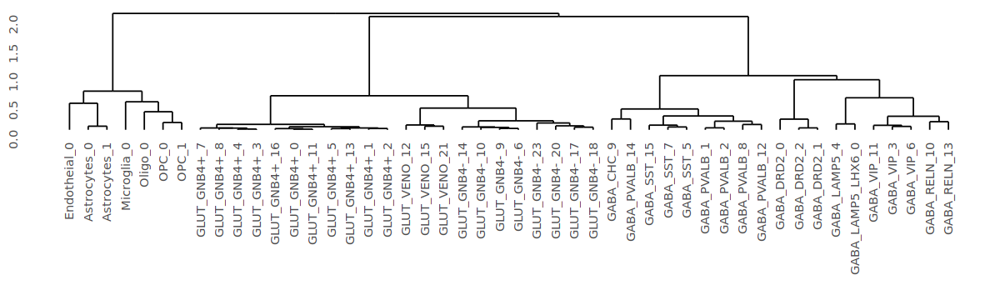

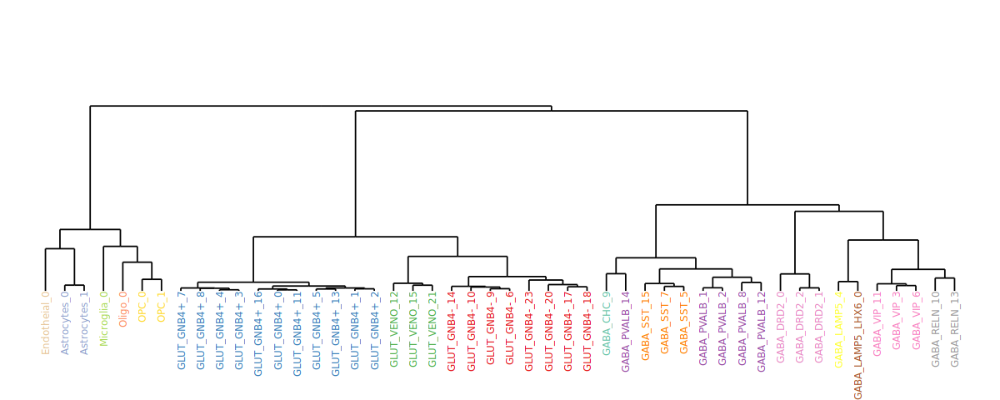

In [6]:
keepGene_df1=keepGene_df %>% group_by(cluster) %>% top_n(wt=avg_log2FC,n=20)
neuronSeurat=classFiltSeurat3
#keepGene=neuronSeurat@assays$SCT@var.features
keepGene=(keepGene_df1$gene)
Idents(neuronSeurat) = "Cluster"
annotClMean = AverageExpression(neuronSeurat, assays="SCT", features=unique(keepGene), slot="counts")
str(annotClMean)

pvRes = pvclust(
    annotClMean$SCT, method.hclust="ward.D2", 
    method.dist=function(x) {return(as.dist(1-cor(x, method="spearman")))}, nboot=100, parallel=F
)
#saveRDS(pvRes, '/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/dend_macaque_snrna_batch123_soupX_0824_SCT1.rds')



dend = as.dendrogram(pvRes$hclust)

options(repr.plot.height=3,repr.plot.width=10)
ggdendrogram(dend)

df=classFiltSeurat3@meta.data[,c('SuperCluster','Cluster')]
df=df[!duplicated(df),]
df=left_join(df,df_col)

dend_data = dendro_data(dend)
annotSubclassTb = as_tibble(neuronSeurat@meta.data[c("Cluster", "SuperCluster")]) %>% 
    group_by(Cluster, SuperCluster) %>% summarize()
labelTb = as_tibble(dend_data$labels)
df_sort=df[,c('SuperCluster','Cluster')]
labelTb = left_join(labelTb, df_sort, by=c("label"="Cluster"))

options(repr.plot.width=10, repr.plot.height=4, size=1)
gp=ggplot(dend_data$segments) + 
    geom_segment(aes(x=x, y=y, xend=xend, yend=yend))+
    geom_text(data = labelTb, aes(x, y, label=label, color=SuperCluster), hjust = 1, angle = 90, size = 2.5) +
    scale_colour_manual(values=pale) +
    ylim(-1, 3) +
    theme_void() +
    theme(legend.position="none")

gp

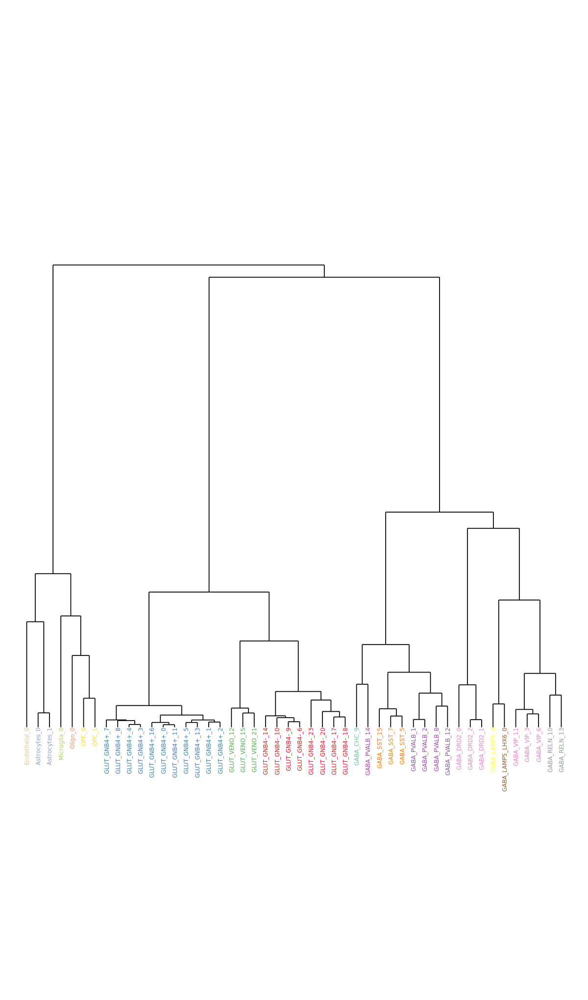

In [10]:
options(repr.plot.width=10, repr.plot.height=17)
gp=ggplot(dend_data$segments) + 
    geom_segment(aes(x=x, y=y, xend=xend, yend=yend))+
    geom_text(data = labelTb, aes(x, y, label=label, color=SuperCluster), hjust = 1, angle = 90, size = 2.5) +
    scale_colour_manual(values=pale) +
    ylim(-1, 3) +
    theme_void() +
    theme(legend.position="none")

gp

In [7]:
order=labelTb$label

In [10]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/dend.pdf", width=10, height=4)
gp
dev.off()


png 
  2

In [11]:
brewer.pal(9,"Set1")

[1] "#E41A1C" "#377EB8" "#4DAF4A" "#984EA3" "#FF7F00" "#FFFF33" "#A65628"
[8] "#F781BF" "#999999"

In [8]:
col_d=c('#FF7F00','#984EA3','#377EB8','#4DAF4A')

names(col_d)=unique(classFiltSeurat3$donor2)

png 
  2

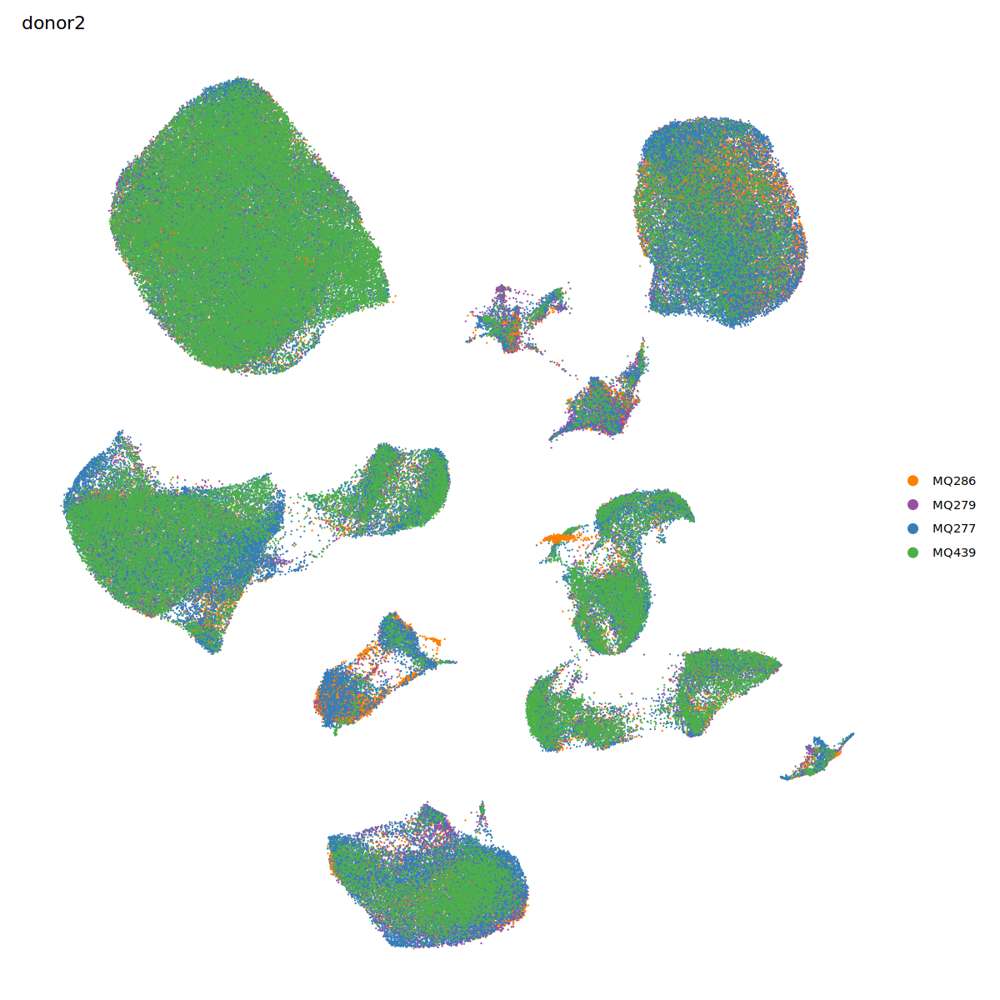

In [9]:
options(repr.plot.width=10, repr.plot.height=10)
gp=DimPlot(classFiltSeurat3,group.by = 'donor2',raster=FALSE,cols = col_d)+coord_fixed()+theme_void()
gp
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/donor1.pdf", width=10, height=10)
gp
dev.off()

png 
  2

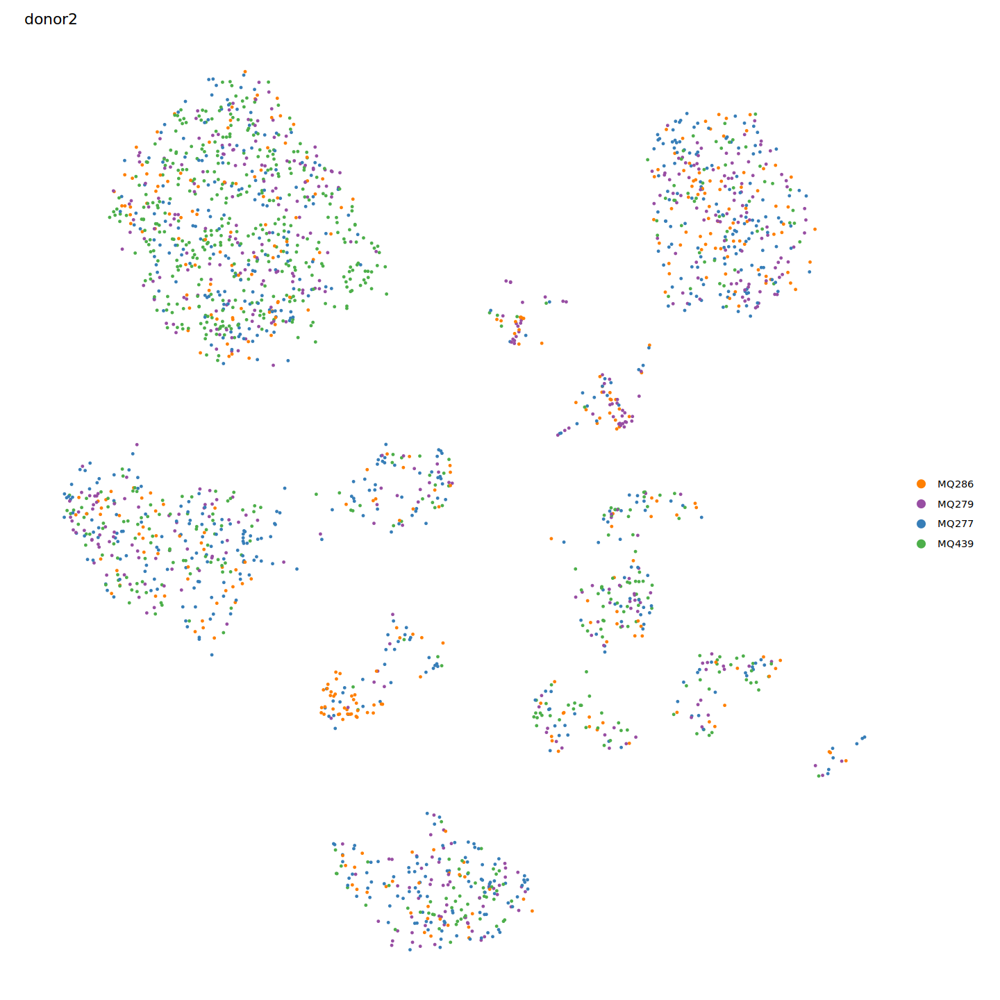

In [10]:
#按照比例downsample
ratio=0.01

df=split(classFiltSeurat3@meta.data,classFiltSeurat3@meta.data$Subclass)
all_n=c()
for(i in c(1:length(df))){
    down_num=round(nrow(df[[i]])*ratio)
    sel_n=sample(rownames(df[[i]]),down_num)
    all_n=c(all_n,sel_n)
}

classFiltSeurat3_down=subset(classFiltSeurat3,cells = all_n)


options(repr.plot.width=12, repr.plot.height=12)
gp=DimPlot(classFiltSeurat3_down,group.by = 'donor2',raster=FALSE,cols = col_d)+coord_fixed()+theme_void()
gp
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/donor2.pdf", width=10, height=10)
gp
dev.off()

In [11]:
df_ref=as.data.frame(col)
colnames(df_ref)='SuperCluster'
df_ref$col=rownames(df_ref)
df_ref1=classFiltSeurat3@meta.data[,c('SuperCluster','Cluster')]
df_ref1=df_ref1[!duplicated(df_ref1),]
df_ref=left_join(df_ref,df_ref1)
col_c=df_ref$col
names(col_c)=df_ref$Cluster


Joining, by = "SuperCluster"


In [12]:
classFiltSeurat3$Cluster=factor(classFiltSeurat3$Cluster,levels = order)

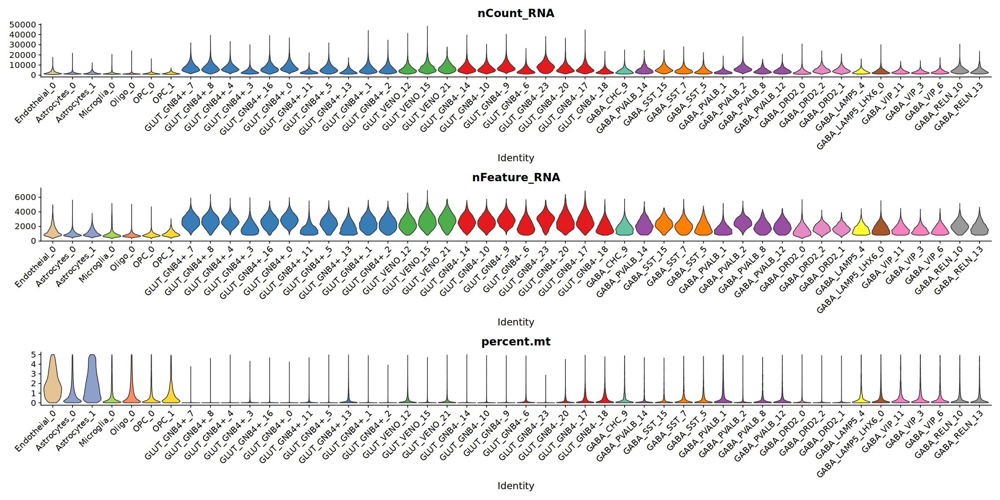

In [13]:
options(repr.plot.width=20, repr.plot.height=10)
Idents(classFiltSeurat3) = "Cluster"
gp=VlnPlot(classFiltSeurat3, features=c("nCount_RNA", "nFeature_RNA", "percent.mt"),cols = col_c, pt.size=0, ncol=1)
gp


In [18]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/qc.pdf", width=20, height=10)
gp
dev.off()

png 
  2

In [15]:
col_d

MQ286     MQ279     MQ277     MQ439 
"#FF7F00" "#984EA3" "#377EB8" "#4DAF4A"

Joining, by = "donor2"
`summarise()` has grouped output by 'Cluster'. You can override using the
`.groups` argument.
Joining, by = "Cluster"


Cluster,donor2,part_num,sum_num,ratio
<fct>,<chr>,<dbl>,<dbl>,<dbl>
Endotheial_0,MQ277,2270.5513,5539.758,0.40986469
Endotheial_0,MQ279,1329.6909,5539.758,0.24002688
Endotheial_0,MQ286,1413.5737,5539.758,0.25516884
Endotheial_0,MQ439,525.9423,5539.758,0.09493958
Astrocytes_0,MQ277,17958.8866,71555.683,0.25097778
Astrocytes_0,MQ279,23709.8266,71555.683,0.33134792


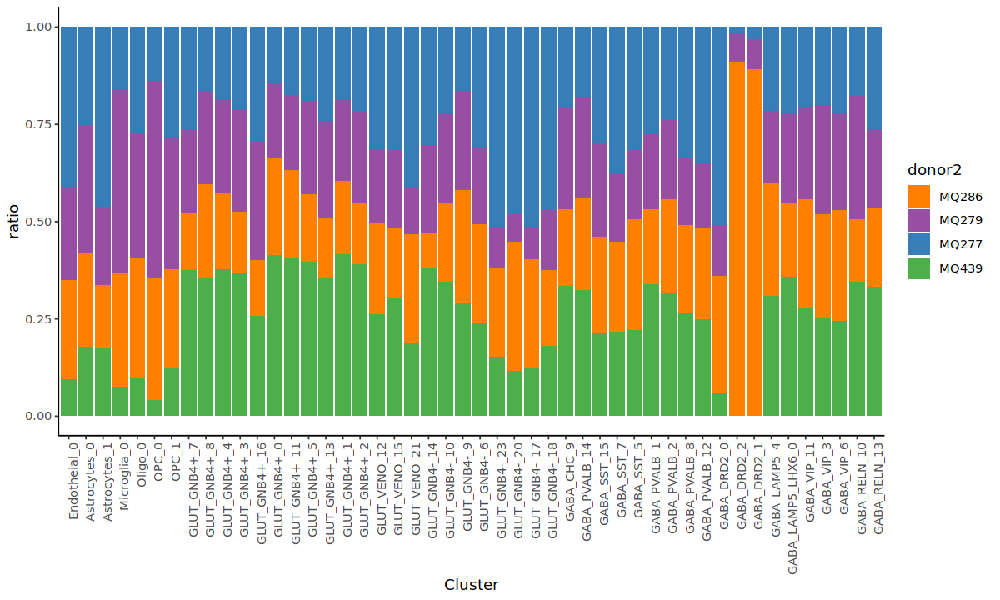

In [17]:

cla=classFiltSeurat3
df_sum=cla@meta.data
#normalize
df_sum$num=1
df_donor=as.data.frame(table(df_sum$donor2))
colnames(df_donor)=c('donor2','all_num')
df_donor$ratio=df_donor$all_num/sum(df_donor$all_num)
df_donor$weight=1/df_donor$ratio
df_donor=df_donor[,c('donor2','weight')]
df_sum=left_join(df_sum,df_donor)
df_sum$num=df_sum$num*df_sum$weight

df1=df_sum %>% group_by(Cluster,donor2) %>% summarise(part_num=sum(num))
df2=df_sum %>% group_by(Cluster) %>% summarise(sum_num=sum(num))
df1=left_join(df1,df2)

df1$ratio=df1$part_num/df1$sum_num

head(df1)
df1$Cluster=factor(df1$Cluster,levels = order)
options(repr.plot.width=10, repr.plot.height=6)

p1=ggplot(data = df1, aes(x = Cluster, y = ratio, fill = donor2),col=col_d) +
scale_fill_manual(values=col_d) +
 geom_bar(stat = "identity", position = "stack")+theme_classic()+
 theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))

p1

In [18]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/donor.pdf", width=10, height=6)
p1
dev.off()



png 
  2

In [23]:
dotplot_genes =c('FLT1','SLC1A2','C1QB','MOBP','PCDH15',
                 'GNB4','ZFPM2','RGS6',
                 'UNC5B','SST','POSTN','PDE10A',
                 'LAMP5','LHX6','VIP','RELN'
              )
dotplot_genes=c(dotplot_genes)
mye.seu=classFiltSeurat3
mye.seu$celltype=mye.seu$Cluster
mye.seu@meta.data$CB=rownames(mye.seu@meta.data)
bubble.df=as.matrix(mye.seu[["RNA"]]@data[dotplot_genes,])
bubble.df=t(bubble.df)
bubble.df=as.data.frame(scale(bubble.df))
bubble.df$CB=rownames(bubble.df)
bubble.df=merge(bubble.df,mye.seu@meta.data[,c("CB","celltype")],by = "CB")
bubble.df$CB=NULL

celltype_v=c()
gene_v=c()
mean_v=c()
ratio_v=c()
for (i in unique(bubble.df$celltype)) {
  bubble.df_small=bubble.df%>%filter(celltype==i)
  for (j in dotplot_genes) {
    exp_mean=mean(bubble.df_small[,j])
    exp_ratio=sum(bubble.df_small[,j] > min(bubble.df_small[,j])) / length(bubble.df_small[,j])
    celltype_v=append(celltype_v,i)
    gene_v=append(gene_v,j)
    mean_v=append(mean_v,exp_mean)
    ratio_v=append(ratio_v,exp_ratio)
  }
}

plotdf=data.frame(
  celltype=celltype_v,
  gene=gene_v,
  exp=mean_v,
  ratio=ratio_v
)
plotdf$celltype=factor(plotdf$celltype,levels =  sort(unique(plotdf$celltype)))

plotdf$gene=factor(plotdf$gene,levels = rev(as.character(dotplot_genes)))
plotdf$exp=ifelse(plotdf$exp>3,3,plotdf$exp)

plotdf_fil=plotdf[plotdf$gene %in% dotplot_genes,]

plotdf_fil$celltype=factor(plotdf_fil$celltype,levels = order)



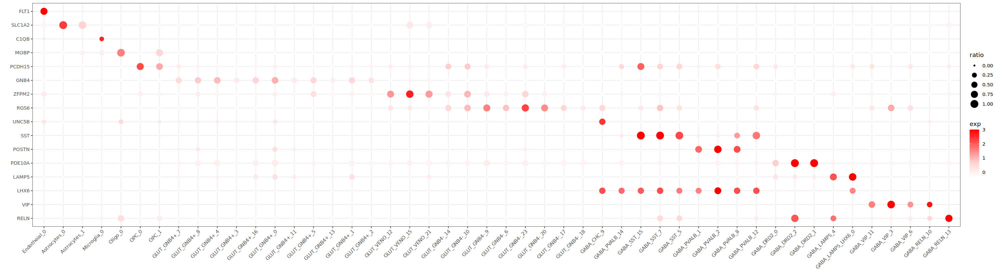

In [25]:
options(repr.plot.width=25, repr.plot.height=7)
gp=ggplot(plotdf_fil,aes(x=celltype,y=gene,size=ratio,color=exp))+geom_point()+
  scale_x_discrete("")+scale_y_discrete("")+
  scale_color_gradientn(colours = c(colorRampPalette(c("white", "#FFD7D7"))(50),colorRampPalette(c("#FFD7D7", "red"))(120)))+
  scale_size_continuous(limits = c(0,1))+theme_bw()+
  theme(
    axis.text.x.bottom = element_text(hjust = 1, vjust = 1, angle = 45)
  )
gp


In [27]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/dot.pdf", width=25, height=8)
gp
dev.off()


png 
  2

Joining, by = "SuperCluster"


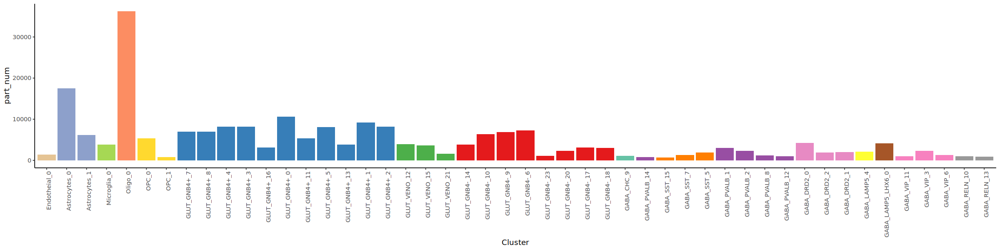

In [37]:
ref=classFiltSeurat3@meta.data
ref=ref[,'Cluster',drop=F]

ref$num=1
sum_ref=ref %>% group_by(Cluster) %>% summarise(part_num=sum(num))
order=labelTb$label
sum_ref$Cluster=factor(sum_ref$Cluster,levels=order)

df_col=as.data.frame(pale)
df_col$SuperCluster=rownames(df_col)
df=classFiltSeurat3@meta.data[,c('Cluster','SuperCluster')]
df=df[!duplicated(df),]

df_col=left_join(df,df_col)

repale=df_col$pale
names(repale)=df_col$Cluster

options(repr.plot.width=20, repr.plot.height=5)
gp=ggplot(data = sum_ref, aes(x = Cluster, y = part_num,fill=Cluster)) +
 geom_bar(stat = "identity", position = "stack")+theme_classic()+
scale_fill_manual(values=repale)+NoLegend()+ theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))
gp
df1=sum_ref

In [39]:
library(ggbreak)

ggbreak v0.1.2

If you use ggbreak in published research, please cite the following
paper:

S Xu, M Chen, T Feng, L Zhan, L Zhou, G Yu. Use ggbreak to effectively
utilize plotting space to deal with large datasets and outliers.
Frontiers in Genetics. 2021, 12:774846. doi: 10.3389/fgene.2021.774846




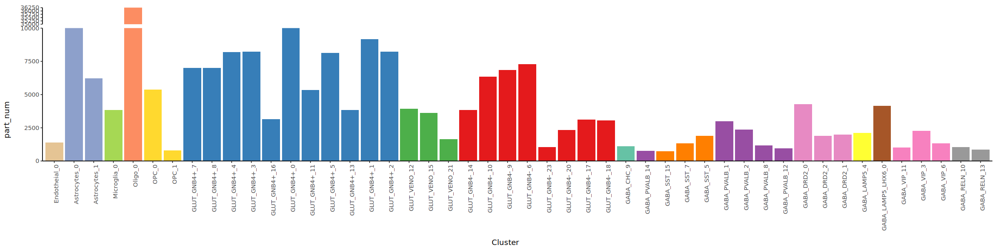

In [45]:
gp1=gp + scale_y_break(c(10000, 35000),scales = "fixed",
expand=expansion(add = c(0, 5)))
gp1

In [55]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/cell_num.pdf", width=20, height=5)
gp1
dev.off()



png 
  2

In [49]:
head(sum_ref[order(sum_ref$part_num,decreasing = T),])

Cluster,part_num
<fct>,<dbl>
Oligo_0,36250
Astrocytes_0,17561
GLUT_GNB4+_0,10655
GLUT_GNB4+_1,9178
GLUT_GNB4+_2,8241
GLUT_GNB4+_3,8224


In [55]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/cell_num.pdf", width=20, height=5)
gp
dev.off()

png 
  2

Warning message in `[.data.frame`(ref, "celltype_pred", drop = F):
“'drop' argument will be ignored”
Joining, by = "SuperCluster"


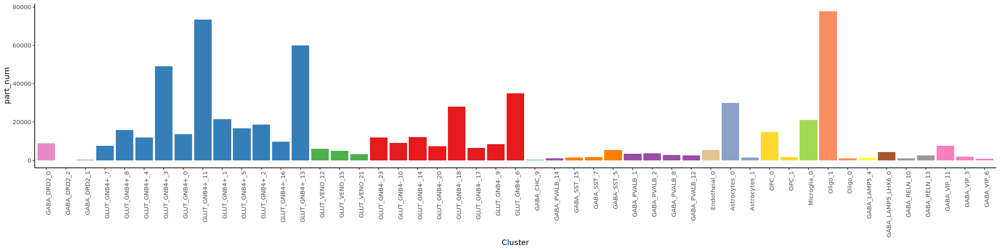

In [14]:
ref=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/dif_res_anno1/SpatialID_20240112_mq1_mq4/transfer_output/macaque1_CLA_res12_49c.csv')
ref=ref['celltype_pred',drop=F]
colnames(ref)='Cluster'


ref$num=1
sum_ref=ref %>% group_by(Cluster) %>% summarise(part_num=sum(num))
order=labelTb$label
sum_ref$Cluster=factor(sum_ref$Cluster,levels=order)

df_col=as.data.frame(pale)
df_col$SuperCluster=rownames(df_col)
df_col=left_join(df,df_col)

repale=df_col$pale
names(repale)=df_col$Cluster

options(repr.plot.width=20, repr.plot.height=5)
gp=ggplot(data = sum_ref, aes(x = Cluster, y = part_num,fill=Cluster)) +
 geom_bar(stat = "identity", position = "stack")+theme_classic()+
scale_fill_manual(values=repale)+NoLegend()+ theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))
gp
df2=sum_ref

Warning message in `[.data.frame`(ref, "celltype_pred", drop = F):
“'drop' argument will be ignored”
Joining, by = "SuperCluster"


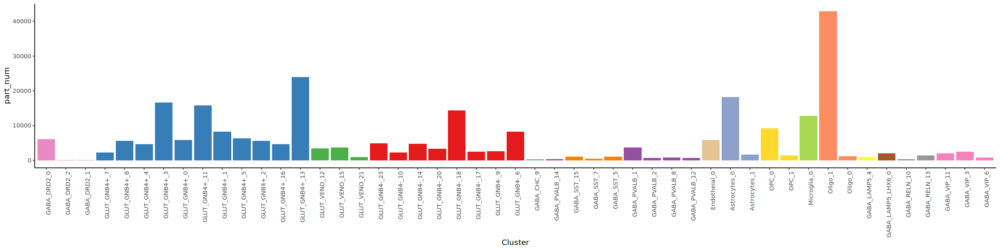

In [15]:
ref=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/dif_res_anno1/SpatialID_20240112_mq1_mq4/transfer_output/macaque4_CLA_res12_49c.csv')
ref=ref['celltype_pred',drop=F]
colnames(ref)='Cluster'


ref$num=1
sum_ref=ref %>% group_by(Cluster) %>% summarise(part_num=sum(num))
order=labelTb$label
sum_ref$Cluster=factor(sum_ref$Cluster,levels=order)

df_col=as.data.frame(pale)
df_col$SuperCluster=rownames(df_col)
df_col=left_join(df,df_col)

repale=df_col$pale
names(repale)=df_col$Cluster

options(repr.plot.width=20, repr.plot.height=5)
gp=ggplot(data = sum_ref, aes(x = Cluster, y = part_num,fill=Cluster)) +
 geom_bar(stat = "identity", position = "stack")+theme_classic()+
scale_fill_manual(values=repale)+NoLegend()+ theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))
gp
df3=sum_ref


In [16]:
colnames(df1)[2]='sn'
colnames(df2)[2]='maca1'
colnames(df3)[2]='maca4'

df1$Cluster=as.character(df1$Cluster)
df2$Cluster=as.character(df2$Cluster)
df3$Cluster=as.character(df3$Cluster)

df_all=left_join(df1,df2)
df_all=left_join(df_all,df3)
cor(df_all$sn,df_all$maca1)
cor(df_all$sn,df_all$maca4)
cor(df_all$maca1,df_all$maca4)

Joining, by = "Cluster"
Joining, by = "Cluster"


[1] 0.4458966

[1] 0.513015

[1] 0.9097092

In [19]:
df_all[df_all$maca1<500,]
df_all[df_all$maca4<500,]

Cluster,sn,maca1,maca4
<chr>,<dbl>,<dbl>,<dbl>
GABA_CHC_9,1119,463,294
GABA_DRD2_1,1982,302,144
GABA_DRD2_2,1895,11,46


Cluster,sn,maca1,maca4
<chr>,<dbl>,<dbl>,<dbl>
GABA_CHC_9,1119,463,294
GABA_DRD2_1,1982,302,144
GABA_DRD2_2,1895,11,46
GABA_PVALB_14,773,1007,341
GABA_RELN_10,1044,969,389


In [73]:
length(unique(classFiltSeurat3$Cluster))

[1] 48

In [74]:

saveRDS(classFiltSeurat3,'/home/share/share_lyx_to_dlj/renew_macaque_sn_anno_0118/48cl_240118_merge_oligo_Cluster_Supercluster_res12.rds')

 

In [1]:

classFiltSeurat3=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/dif_res_anno1/final_anno/48cl_240118_merge_oligo_Cluster_Supercluster_res12.rds')

 

rgeos version: 0.6-3, (SVN revision 696)
 GEOS runtime version: 3.11.0-CAPI-1.17.0 
 Please note that rgeos will be retired during October 2023,
plan transition to sf or terra functions using GEOS at your earliest convenience.
See https://r-spatial.org/r/2023/05/15/evolution4.html for details.
 GEOS using OverlayNG
 Linking to sp version: 1.6-0 
 Polygon checking: TRUE 




In [13]:
length(unique(classFiltSeurat3$Cluster))

[1] 48

In [32]:
saveRDS(classFiltSeurat3,'/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/dif_res_anno1/final_anno/49cl_240108_Cluster_Supercluster_res12.rds')

 

In [2]:
classFiltSeurat3=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/dif_res_anno1/final_anno/48cl_240118_merge_oligo_Cluster_Supercluster_res12.rds')




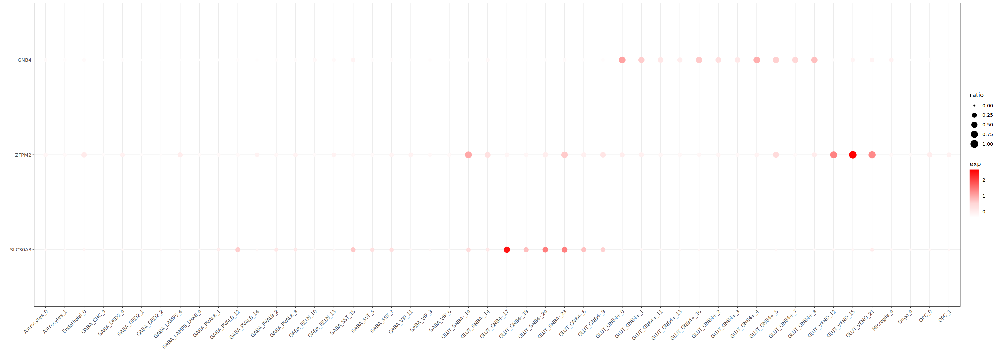

In [14]:
dotplot_genes =c(
                 'GNB4','ZFPM2','SLC30A3'
                 #'UNC5B','SST','POSTN','PDE10A',
                 #'LAMP5','VIP','RELN'
              )
#dotplot_genes=str_to_title(tolower(dotplot_genes))

dotplot_genes=c(dotplot_genes)
mye.seu=classFiltSeurat3
mye.seu$celltype=mye.seu$Cluster
mye.seu@meta.data$CB=rownames(mye.seu@meta.data)
bubble.df=as.matrix(mye.seu[["RNA"]]@data[dotplot_genes,])
bubble.df=t(bubble.df)
bubble.df=as.data.frame(scale(bubble.df))
bubble.df$CB=rownames(bubble.df)
bubble.df=merge(bubble.df,mye.seu@meta.data[,c("CB","celltype")],by = "CB")
bubble.df$CB=NULL

celltype_v=c()
gene_v=c()
mean_v=c()
ratio_v=c()
for (i in unique(bubble.df$celltype)) {
  bubble.df_small=bubble.df%>%filter(celltype==i)
  for (j in dotplot_genes) {
    exp_mean=mean(bubble.df_small[,j])
    exp_ratio=sum(bubble.df_small[,j] > min(bubble.df_small[,j])) / length(bubble.df_small[,j])
    celltype_v=append(celltype_v,i)
    gene_v=append(gene_v,j)
    mean_v=append(mean_v,exp_mean)
    ratio_v=append(ratio_v,exp_ratio)
  }
}

plotdf=data.frame(
  celltype=celltype_v,
  gene=gene_v,
  exp=mean_v,
  ratio=ratio_v
)
plotdf$celltype=factor(plotdf$celltype,levels =  sort(unique(plotdf$celltype)))

plotdf$gene=factor(plotdf$gene,levels = rev(as.character(dotplot_genes)))
plotdf$exp=ifelse(plotdf$exp>3,3,plotdf$exp)

plotdf_fil=plotdf[plotdf$gene %in% dotplot_genes,]

#plotdf_fil$celltype=factor(plotdf_fil$celltype,levels = order)
#plotdf_fil=plotdf_fil[grep('GLUT',plotdf_fil),]
options(repr.plot.width=25, repr.plot.height=9)
gp=ggplot(plotdf_fil,aes(x=celltype,y=gene,size=ratio,color=exp))+geom_point()+
  scale_x_discrete("")+scale_y_discrete("")+
  scale_color_gradientn(colours = c(colorRampPalette(c("white", "#FFD7D7"))(50),colorRampPalette(c("#FFD7D7", "red"))(120)))+
  scale_size_continuous(limits = c(0,1))+theme_bw()+
  theme(
    axis.text.x.bottom = element_text(hjust = 1, vjust = 1, angle = 45)
  )
gp

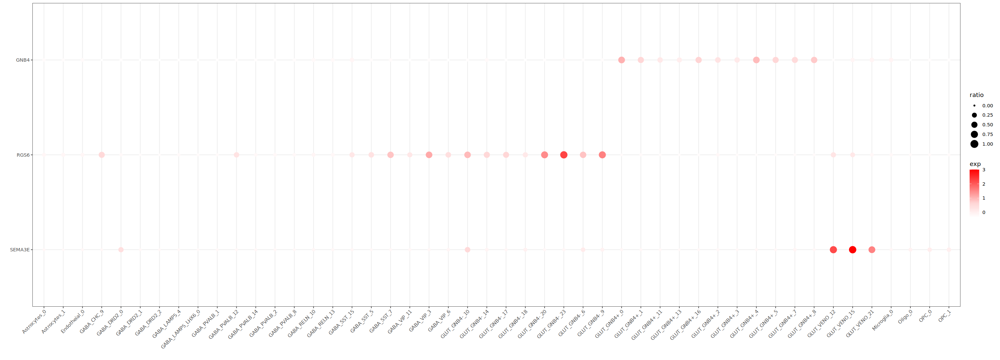

In [19]:
dotplot_genes =c(
                 'GNB4','RGS6','SEMA3E'
                 #'UNC5B','SST','POSTN','PDE10A',
                 #'LAMP5','VIP','RELN'
              )
#dotplot_genes=str_to_title(tolower(dotplot_genes))

dotplot_genes=c(dotplot_genes)
mye.seu=classFiltSeurat3
mye.seu$celltype=mye.seu$Cluster
mye.seu@meta.data$CB=rownames(mye.seu@meta.data)
bubble.df=as.matrix(mye.seu[["RNA"]]@data[dotplot_genes,])
bubble.df=t(bubble.df)
bubble.df=as.data.frame(scale(bubble.df))
bubble.df$CB=rownames(bubble.df)
bubble.df=merge(bubble.df,mye.seu@meta.data[,c("CB","celltype")],by = "CB")
bubble.df$CB=NULL

celltype_v=c()
gene_v=c()
mean_v=c()
ratio_v=c()
for (i in unique(bubble.df$celltype)) {
  bubble.df_small=bubble.df%>%filter(celltype==i)
  for (j in dotplot_genes) {
    exp_mean=mean(bubble.df_small[,j])
    exp_ratio=sum(bubble.df_small[,j] > min(bubble.df_small[,j])) / length(bubble.df_small[,j])
    celltype_v=append(celltype_v,i)
    gene_v=append(gene_v,j)
    mean_v=append(mean_v,exp_mean)
    ratio_v=append(ratio_v,exp_ratio)
  }
}

plotdf=data.frame(
  celltype=celltype_v,
  gene=gene_v,
  exp=mean_v,
  ratio=ratio_v
)
plotdf$celltype=factor(plotdf$celltype,levels =  sort(unique(plotdf$celltype)))

plotdf$gene=factor(plotdf$gene,levels = rev(as.character(dotplot_genes)))
plotdf$exp=ifelse(plotdf$exp>3,3,plotdf$exp)

plotdf_fil=plotdf[plotdf$gene %in% dotplot_genes,]

#plotdf_fil$celltype=factor(plotdf_fil$celltype,levels = order)
#plotdf_fil=plotdf_fil[grep('GLUT',plotdf_fil),]
options(repr.plot.width=25, repr.plot.height=9)
gp=ggplot(plotdf_fil,aes(x=celltype,y=gene,size=ratio,color=exp))+geom_point()+
  scale_x_discrete("")+scale_y_discrete("")+
  scale_color_gradientn(colours = c(colorRampPalette(c("white", "#FFD7D7"))(50),colorRampPalette(c("#FFD7D7", "red"))(120)))+
  scale_size_continuous(limits = c(0,1))+theme_bw()+
  theme(
    axis.text.x.bottom = element_text(hjust = 1, vjust = 1, angle = 45)
  )
gp

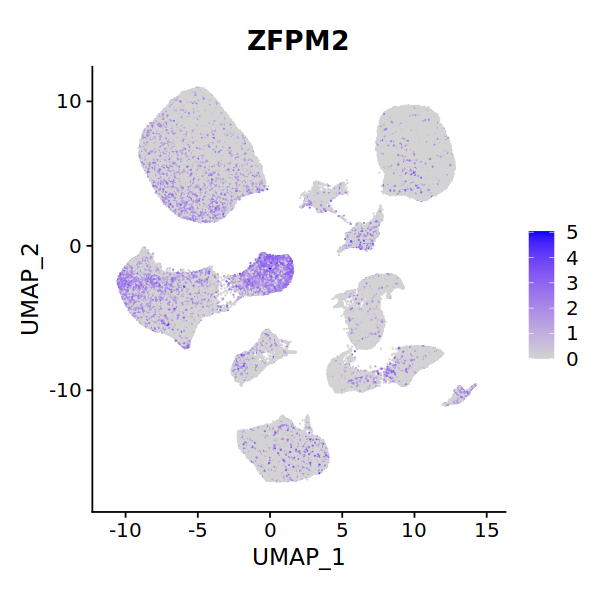

In [20]:

classMarkerTop = c('ZFPM2')

options(repr.plot.width=5, repr.plot.height=5)
gp4=FeaturePlot(classFiltSeurat3, features = classMarkerTop,raster=FALSE)+coord_fixed()

gp4

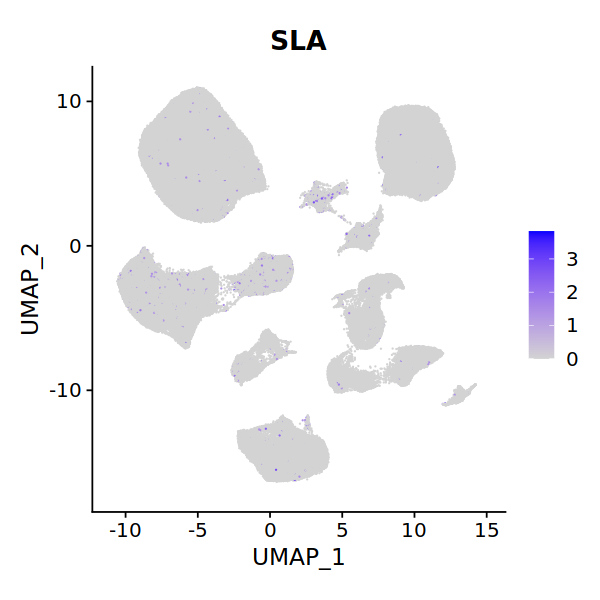

In [6]:

classMarkerTop = c('SLA')

options(repr.plot.width=5, repr.plot.height=5)
gp4=FeaturePlot(classFiltSeurat3, features = classMarkerTop,raster=FALSE)+coord_fixed()

gp4

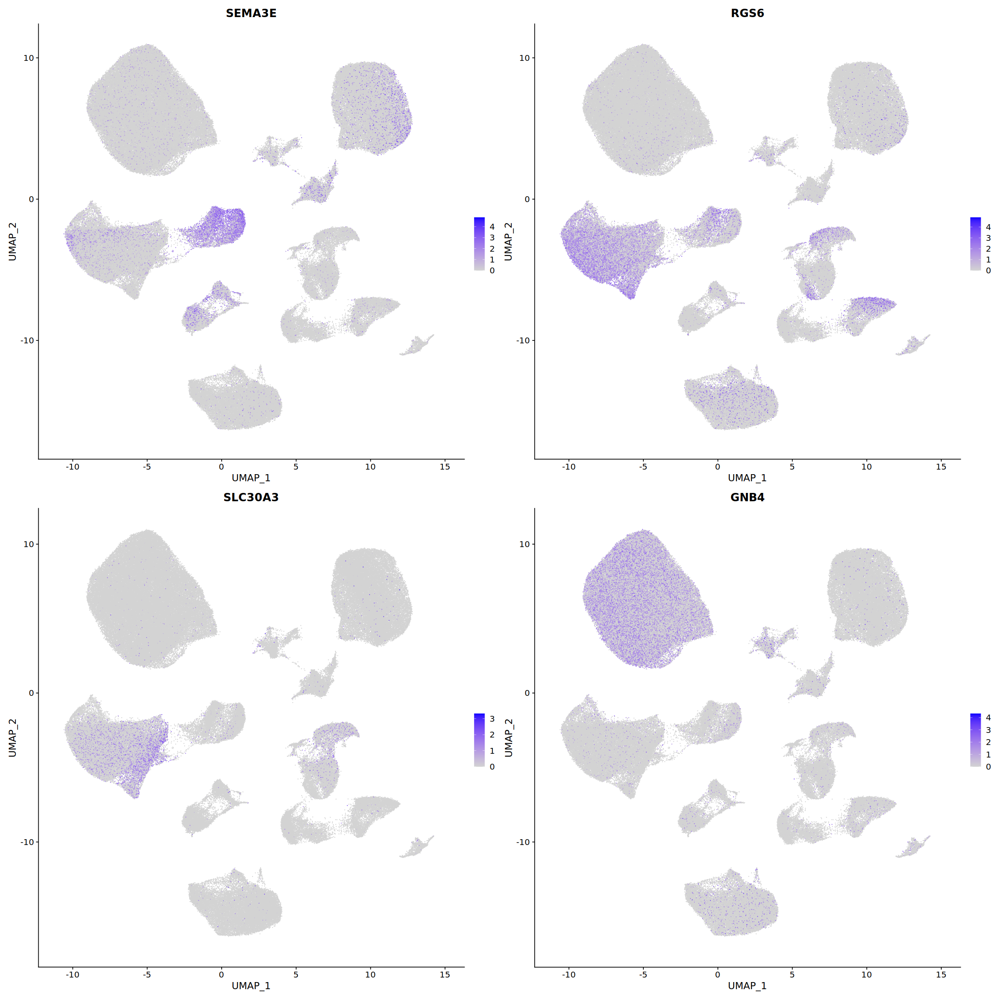

In [4]:

classMarkerTop = c('SEMA3E','RGS6','SLC30A3','GNB4')

options(repr.plot.width=20, repr.plot.height=20)
gp4=FeaturePlot(classFiltSeurat3, features = classMarkerTop,raster=FALSE)+coord_fixed()

gp4

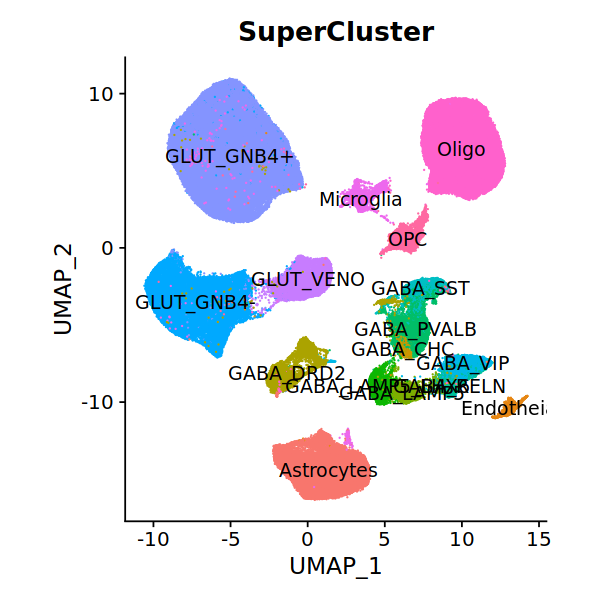

In [5]:
options(repr.plot.width=5, repr.plot.height=5)
DimPlot(classFiltSeurat3,group.by = 'SuperCluster',label=T,raster=FALSE)+coord_fixed()+NoLegend()



In [14]:
pale=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/post_analysis/data/color_supercluster.csv')

col=pale$pale
names(col)=pale$X
col


GLUT_GNB4-      GLUT_GNB4+       GLUT_VENO      GABA_PVALB        GABA_SST 
      "#E41A1C"       "#377EB8"       "#4DAF4A"       "#984EA3"       "#FF7F00" 
     GABA_LAMP5 GABA_LAMP5_LHX6        GABA_VIP       GABA_RELN        GABA_CHC 
      "#FFFF33"       "#A65628"       "#F781BF"       "#999999"       "#66C2A5" 
          Oligo      Astrocytes       GABA_DRD2       Microglia             OPC 
      "#FC8D62"       "#8DA0CB"       "#E78AC3"       "#A6D854"       "#FFD92F" 
     Endotheial 
      "#E5C494"

In [15]:
33872/122006

[1] 0.2776257

In [16]:
all_n=unique(classFiltSeurat3$Cluster)
length(all_n[grep('GLUT',all_n)])
length(all_n[grep('GABA',all_n)])


[1] 22

[1] 19

In [17]:
readDir='/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/dif_res_anno1/SpatialID_20240112_mq1_mq4/transfer_output/'
anno_maca1=read.csv(paste0(readDir,'macaque1_CLA_res12_49c.csv'))
anno_maca2=read.csv(paste0(readDir,'macaque4_CLA_res12_49c.csv'))
anno_maca1[anno_maca1$celltype_pred=='Oligo_1',]$celltype_pred='Oligo_0'
anno_maca2[anno_maca2$celltype_pred=='Oligo_1',]$celltype_pred='Oligo_0'



In [18]:
macaque_meta=classFiltSeurat3@meta.data
ref=macaque_meta[,c('SuperCluster','Cluster')]
colnames(ref)=c('SuperCluster','celltype_pred')
ref=ref[!duplicated(ref),]
anno_maca1=left_join(anno_maca1,ref)
anno_maca2=left_join(anno_maca2,ref)

anno_maca1$num=1
anno_maca2$num=1
macaque_meta$num=1



Joining, by = "celltype_pred"
Joining, by = "celltype_pred"


In [21]:

maca1=anno_maca1 %>% group_by(SuperCluster)  %>% summarise(group_num=sum(num))
maca1$group='stero-seq macaque1'
maca1$ratio=maca1$group_num/sum(maca1$group_num)

maca2=anno_maca2 %>% group_by(SuperCluster)  %>% summarise(group_num=sum(num))
maca2$group='stero-seq macaque2'
maca2$ratio=maca2$group_num/sum(maca2$group_num)


sn=macaque_meta %>% group_by(SuperCluster)  %>% summarise(group_num=sum(num))
sn$group='snRNA-seq'
sn$ratio=sn$group_num/sum(sn$group_num)

sum_all=rbind(maca1,maca2,sn)

sum_all$ratio=sum_all$ratio

df_ref=as.data.frame(col)
colnames(df_ref)='SuperCluster'
df_ref$col=rownames(df_ref)
col_s=df_ref$col
names(col_s)=df_ref$SuperCluster
options(repr.plot.width=7, repr.plot.height=5)



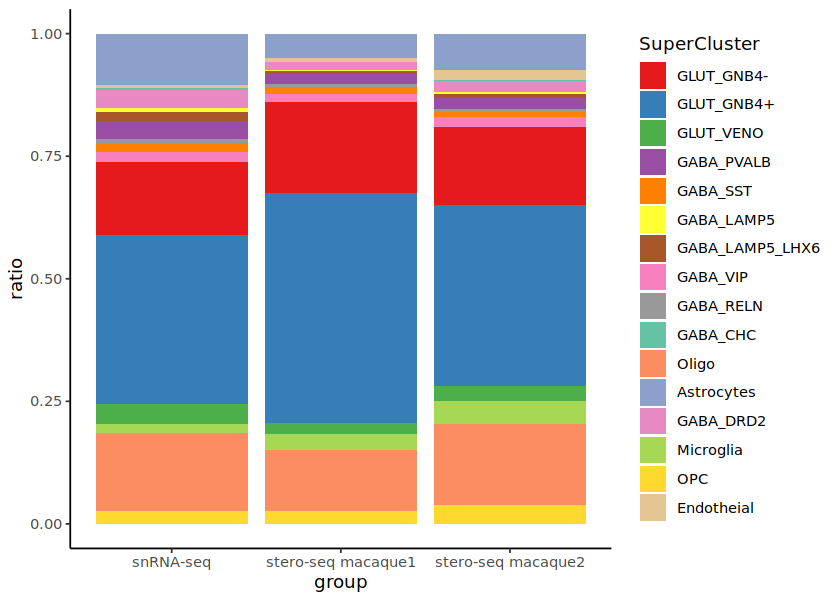

In [23]:
gp=ggplot(data = sum_all, aes(x = group, y = ratio, fill = SuperCluster)) +
 geom_bar(stat = "identity", position = "stack")+theme_classic()+
scale_fill_manual(values =col)
gp


In [24]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig1_renew_240118/sn_spatial_ratio.pdf", width=7, height=5)
gp
dev.off()

png 
  2

In [ ]:
suppressMessages(library(tidyverse))
suppressMessages(library(parallel))
suppressMessages(library(Seurat))
#suppressMessages(library(SeuratData))
suppressMessages(library(patchwork))
suppressMessages(library(Matrix))
suppressMessages(library(viridis))
suppressMessages(library(cowplot))
suppressMessages(library(ggsci))
suppressMessages(library(reshape2))
library(arrow)
options(future.globals.maxSize= 891289600*16*1600)


getbin = function(slice_id){


readDir='/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/renew_spatial_data_240202_toushe/macaque-20240201_macaque7_manual_label/'
totalGeneFile=paste0(readDir,'total_gene_',slice_id,'_macaque_f001_2D_macaque-20240201_macaque7_manual_label.parquet')

message("Working cell summary on:", totalGeneFile)
#rtSBATCH --mem 1000000
totalGeneTb_liso = read_parquet(totalGeneFile)
#totalGeneTb_liso=totalGeneTb_liso[sample(nrow(totalGeneTb_liso),30000),]


annoDir=readDir
anno_area=read.csv(paste0(annoDir,'/region-macaque-20240201_macaque7_manual_label.csv'))
#area=unique(anno_area[anno_area$note %in% c('pu','cla','ins','amy'),]$global_region_id)
#totalGeneTb_liso=totalGeneTb_liso[totalGeneTb_liso$gene_area %in%area,]

#totalGeneTb_liso=totalGeneTb_liso[c(1:10000),]
totalGeneTb_liso$x=totalGeneTb_liso$rx
totalGeneTb_liso$y=totalGeneTb_liso$ry

totalGeneTb=totalGeneTb_liso

dnbSumTb = totalGeneTb %>% group_by(x, y) %>% summarize(
    umi_count = sum(umi_count),
    detectGeneCount = length(unique(gene)),
    cell_label = cell_label[1],
    gene_area = gene_area[1]
) %>% ungroup() # Be careful to ungroup before mutate

# For each cell, we use the gene_area with most DNB support.
cellSumTb = dnbSumTb %>% group_by(cell_label) %>% summarize(
    x = as.integer(mean(x)), # Use DNB average position as cell position
    y = as.integer(mean(y)),
    cell_area = ifelse(
        all(is.na(gene_area)), NA,
        names(sort(table(gene_area), decreasing=T))[1]
    )
) %>% ungroup()


# Remove cell_id 0
cellSumTb = subset(cellSumTb, cell_label != 0)
# cellSumFile = paste0(outCellSumDir, "/", sub("total_gene_", "total_cell_", f))
# write_tsv(cellSumTb, cellSumFile)

# Sum gene expression for each cell
cellCountTb = subset(totalGeneTb, cell_label != 0) %>% group_by(cell_label, gene) %>% summarize(
    umi_count = sum(umi_count)
) %>% ungroup()
cellCountTb = cellCountTb %>% mutate(
    gene = as.factor(gene),
    cell_label = as.factor(cell_label)
)

secId = "hip"
dimName = list(levels(cellCountTb$gene), levels(cellCountTb$cell_label))
cellCountMx = sparseMatrix(
    as.integer(cellCountTb$gene), as.integer(cellCountTb$cell_label),
    x=cellCountTb$umi_count, dimnames=dimName
)
cellBinSeurat = CreateSeuratObject(counts=cellCountMx, assay="Spatial")

coordinatesDf = cellSumTb[c("cell_label", "x", "y")] %>% tibble::column_to_rownames("cell_label")
colnames(coordinatesDf) = c("imagecol","imagerow")
coordinatesDf = coordinatesDf[rownames(cellBinSeurat@meta.data),]
addMetaDf = as.data.frame(cellSumTb[c(
    "cell_label", "x", "y", "cell_area"
)])
addMetaDf$secId = secId
rownames(addMetaDf) = addMetaDf$cell_label
addMetaDf = addMetaDf[rownames(cellBinSeurat@meta.data),]


#额外加区域信息
cell_id_label=addMetaDf$cell_label
colnames(anno_area)[7]='cell_area'
anno_area=anno_area[,c('origin_name','cell_area')]
anno_area=anno_area[!duplicated(anno_area),]
anno_area$cell_area=as.character(anno_area$cell_area)
addMetaDf=left_join(addMetaDf,anno_area)
if(nrow(addMetaDf[is.na(addMetaDf$cell_label),])>0){addMetaDf[is.na(addMetaDf$cell_label),]$cell_label=0}

#addMetaDf[is.na(addMetaDf$cell_label),]$cell_label=0
#rownames(addMetaDf)=cell_id_label

cellBinSeurat = AddMetaData(cellBinSeurat, addMetaDf$x,col.name = 'x')
cellBinSeurat = AddMetaData(cellBinSeurat, addMetaDf$y,col.name = 'y')
cellBinSeurat = AddMetaData(cellBinSeurat, addMetaDf$cell_area,col.name = 'cell_area')

#cellBinSeurat = AddMetaData(cellBinSeurat, metadata=addMetaDf)

MTGenes = c("ND6","COX3","COX1","ND5","ND4","ND2","ND4L","ATP8","CYTB","COX2","ND3","ATP6","ND1")
cellBinSeurat[["percent.mt"]] <- PercentageFeatureSet(cellBinSeurat,features = MTGenes)

outDir='/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/renew_spatial_data_240202_toushe/cell_bin_boundary_manual/'

saveRDS(cellBinSeurat, paste0(outDir,slice_id,'cellbin.rds'))

}

all_f=list.files('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/renew_spatial_data_240202_toushe/macaque-20240201_macaque7_manual_label/')
allFile=all_f[grep('parquet',all_f)]
all_slice_id=str_extract(allFile,'T[0-9]*')
undone_id=all_slice_id
undone_id

thread = 2
mclapply(
    undone_id,
    function(slice_id) {getbin(slice_id)},
    mc.cores=thread
)


In [ ]:
#!/bin/bash
#SBATCH -e /home/liuyx/liuyuxuan/spa_seurat/cla/macaca/renew_spatial_data_240202_toushe/cell_bin_boundary_manual/err
#SBATCH -o /home/liuyx/liuyuxuan/spa_seurat/cla/macaca/renew_spatial_data_240202_toushe/cell_bin_boundary_manual/out
#SBATCH -J mkrds
#SBATCH -p pro
#SBATCH -n 2
#SBATCH --mem 700000
Rscript /home/liuyx/liuyuxuan/spa_seurat/cla/macaca/renew_spatial_data_240202_toushe/cell_bin_boundary_manual/mkrds.R

